# Instance Impact Framework: Full-Pipeline Case Study Notebook

## Overview

**The Pipeline** — A live end-to-end run on a Nepal flooding example: SAM3 building detection → Stage 2a exposure estimation → Stage 2b calibrated ensemble damage inference, with per-instance uncertainty visualization.

**Addendum — 2025 LA Wildfires** — Pre-computed results from applying the same pipeline across ~197 km² of LA County: 21,797 buildings assessed over 4 post-disaster acquisition dates using coverage-aware multi-date damage aggregation.

*A brief xView2 detection benchmark and data statement follow at the end.*

---

## Objective
This notebook executes and presents the **entire packaged pipeline** from raw pre/post input images to instance-level impact outputs.
You should expect per-building outputs from each stage: Stage 1 instance polygons with segmentation confidence, Stage 2a exposure signals (predicted population and building type), and Stage 2b damage predictions with calibrated confidence and uncertainty metrics.
The notebook culminates in a merged instance table, uncertainty-ranked cases, and polygon overlays that make each prediction interpretable in its visual context.

## Introduction
The increasing availability of high-resolution pre- and post-disaster satellite imagery has created new opportunities for automated, building-level damage assessment. However, many operational workflows still rely on either coarse area-level summaries or single-task predictions that do not jointly represent physical damage, exposure, and uncertainty at the building instance level. This gap limits practical use in time-critical scenarios such as emergency triage and post-event resource allocation.

This project introduces an **Instance Impact Framework** that produces building-level impact representations by integrating three complementary stages: (1) building instance extraction from imagery, (2) occupancy/exposure signal estimation, and (3) calibrated damage-state inference with uncertainty quantification. The framework is delivered as an end-to-end, reproducible inference pipeline and presentation notebook that can run on managed research platforms across CPU and GPU contexts.

To demonstrate applicability, this notebook executes a complete case study from input pre/post imagery to final interpretable outputs, including merged instance tables, uncertainty-ranked cases, and visual overlays. The system is designed to support both research reproducibility and operational interpretability through explicit stage outputs, confidence signals, and transparent intermediate artifacts.

## Theory of Impact
Building-level disaster response decisions require more than binary damaged/not-damaged maps. By representing each building instance with both **damage severity** and **exposure proxies** (e.g., estimated population/type), the framework enables more actionable prioritization, such as identifying locations with high expected impact and high uncertainty for human review.

This instance-centric approach supports practical workflows in emergency management, humanitarian logistics, and resilience planning by enabling: (a) targeted triage, (b) uncertainty-aware escalation, and (c) auditable evidence linking predictions to visual context. In this way, the framework shifts output from static classification toward decision-support-ready geospatial intelligence.

## Novelty
- **Instance-Centric Integration:** Rather than treating extraction, exposure estimation, and damage prediction as isolated tasks, we explicitly align them by shared `instance_id` and synthesize them into a unified building-level representation.
- **Operational Uncertainty:** Stage 2b includes calibrated probabilities and ensemble-derived uncertainty metrics (`pmax`, margin, entropy, expected-severity variance), supporting abstention and review workflows rather than overconfident automation.
- **Reusable Shared Artifacts:** Standardized per-instance pre/post crops and masks are generated once and reused across downstream stages, improving reproducibility and modular extensibility.
- **End-to-End Reproducible Delivery:** The packaged notebook and CLI pipeline provide a runnable path from imagery input to interpretable outputs, with explicit logging and stage-level sanity checks suitable for platform-constrained environments (CPU/GPU).

## Pipeline
`Stage1 -> shared subimages -> Stage2a -> Stage2b -> presentation -> overlays`

![Instance Impact Conceptualization](II-Conceptualization.png)

## Assumptions
- Dependencies are resolved automatically via the notebook's bootstrap cells (`.nb_vendor`); no manual environment setup is required beyond a compatible base kernel.
- Input pre/post images are valid and correspond to the same tile.
- The notebook is run top-to-bottom without skipping cells.
- A Hugging Face access token is required for Stage 1 (SAM3 is a gated model).
- On a clean kernel, the dependency bootstrap may install packages that require a kernel restart to take effect. If the validation step fails on first run, restart the kernel and re-run all cells from the top.

## Scope
- Inference + presentation only (no training).
- Structured for server-kernel execution with reproducible paths and commands.

## Reproducibility and Environment Strategy

This notebook is designed for top-down execution in managed research kernels where direct modification of the base environment may be restricted. To preserve reproducibility, dependencies are installed into a project-local directory (`.nb_vendor`) and injected into both notebook imports and subprocess-based stage scripts.

This strategy provides two practical benefits: (1) compatibility across CPU-only and GPU-enabled sessions on i-guide, and (2) isolation from user-site package drift that can otherwise break scientific dependencies. The next two code cells perform dependency bootstrap and import validation before any model stage begins.

## Methods: Execution Protocol

The pipeline is implemented as a staged experimental protocol where each stage emits explicit artifacts used by subsequent stages. The initial setup cells establish path conventions, dependency resolution, authentication, and runtime device configuration so that Stage 1 through Stage 2b can be executed and audited consistently.

Methodologically, this notebook follows a deterministic order: environment bootstrap -> stage execution -> stage-level sanity reporting -> final synthesis and uncertainty-driven interpretation.

## Model Specification (Run Configuration)

This case study uses the packaged inference stack exactly as configured in this notebook run.

- **Stage 1 (Instance Extraction):** SAM3 via `samgeo` + `transformers` backend, producing instance-level polygons and confidence from pre-disaster imagery.
- **Stage 2a (Exposure Proxy):** Native three-class EfficientNet-B0 ensemble for building type (`commercial`, `residential_multi`, `residential_small`), followed by the packaged `log_footprint_m2 + soft type + residual HGB` population model. The ambiguous `institutional` and `other` classes are excluded from this packaged Stage 2a route.
- **Stage 2b (Damage + Uncertainty):** Siamese ordinal CORAL-style damage inference, executed as a calibrated multi-checkpoint ensemble with uncertainty metrics (`pmax`, margin, entropy, expected-severity variance).
- **Calibration mode:** Stage 2b uses packaged temperature calibration directories. Stage 2a uses no temperature scaling by default; its ensemble probabilities are averaged directly unless an explicitly validated temperature vector is supplied outside this notebook.
- **Checkpoint provenance:** model files are loaded from `II_package/models/` with configs in `II_package/configs/` and calibration artifacts in `II_package/calibration/`.

This section is intentionally concise; implementation-level details remain traceable in the stage scripts and companion technical logs.


In [1]:
from pathlib import Path
import os
import json
import shutil
import subprocess
import shlex
import sys
import importlib

# Resolve notebook directory robustly.
# Managed kernels (e.g., i-guide geoai) may have a stale or deleted cwd,
# so we prefer IPython's _dh (notebook launch dir) with cwd() as fallback.
try:
    _nb_dir = Path(globals()["_dh"][0])
except Exception:
    try:
        _nb_dir = Path.cwd()
    except Exception:
        _nb_dir = Path(os.environ.get("HOME", "/tmp"))

VENDOR = _nb_dir / ".nb_vendor"
VENDOR.mkdir(parents=True, exist_ok=True)

if str(VENDOR) not in sys.path:
    sys.path.insert(0, str(VENDOR))
importlib.invalidate_caches()
print("Using local vendor path:", VENDOR)
print("Base imports ready.")

Using local vendor path: c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\.nb_vendor
Base imports ready.


### Core Imports and Local Path Setup

Foundational Python modules are imported and the `.nb_vendor` overlay path is initialized. If `.nb_vendor` exists, it is prioritized in `sys.path` to ensure deterministic dependency resolution for this notebook run.

In [2]:
# Cell 1/2: robust dependency setup for notebook
#
# Rule:
# - Native/heavy packages stay in the real .venv.
# - .nb_vendor is only for lighter notebook-local packages.
#
# This avoids broken imports from vendored numpy/geopandas/opencv/tokenizers.

import sys
import subprocess
import importlib
import importlib.metadata as importlib_metadata
import shutil
from pathlib import Path


# ---------------------------------------------------------------------
# Vendor path
# ---------------------------------------------------------------------

try:
    VENDOR
except NameError:
    VENDOR = Path.cwd() / ".nb_vendor"

VENDOR = Path(VENDOR)
VENDOR.mkdir(parents=True, exist_ok=True)


# ---------------------------------------------------------------------
# Helpers
# ---------------------------------------------------------------------

def module_loaded_from_vendor(module_name):
    mod = sys.modules.get(module_name)
    if mod is None:
        return False

    mod_file = getattr(mod, "__file__", None)
    if not mod_file:
        return False

    mod_path = Path(mod_file).resolve()
    vendor_path = VENDOR.resolve()

    try:
        return mod_path.is_relative_to(vendor_path)
    except AttributeError:
        try:
            mod_path.relative_to(vendor_path)
            return True
        except ValueError:
            return False


def clean_vendor_package(package_stem):
    package_stem = str(package_stem)

    patterns = [
        package_stem,
        f"{package_stem}-*.dist-info",
        f"{package_stem}.libs",
        f"{package_stem}_*.dist-info",
    ]

    underscore = package_stem.replace("-", "_")
    patterns.extend([
        underscore,
        f"{underscore}-*.dist-info",
        f"{underscore}_*.dist-info",
        f"{underscore}.libs",
    ])

    for pattern in patterns:
        for p in VENDOR.glob(pattern):
            if p.exists():
                print("[clean vendor]", p)
                if p.is_dir():
                    shutil.rmtree(p)
                else:
                    p.unlink()


def normalize_specs(specs):
    if isinstance(specs, str):
        return [specs]
    return list(specs)


def specs_label(specs):
    return " ".join(normalize_specs(specs))


def run_cmd(cmd, label):
    print("[cmd]", " ".join(map(str, cmd)))

    result = subprocess.run(
        list(map(str, cmd)),
        stdout=subprocess.PIPE,
        stderr=subprocess.STDOUT,
        text=True,
    )

    print(result.stdout)

    if result.returncode != 0:
        raise RuntimeError(
            f"{label} failed with exit code {result.returncode}:\n"
            f"{' '.join(map(str, cmd))}"
        )


def pip_install_real_env(specs, no_deps=False, force_reinstall=False):
    cmd = [
        sys.executable,
        "-m",
        "pip",
        "install",
        "--upgrade",
    ]

    if force_reinstall:
        cmd.append("--force-reinstall")

    if no_deps:
        cmd.append("--no-deps")

    cmd.extend(normalize_specs(specs))
    run_cmd(cmd, "real env pip install")


def pip_install_vendor(specs, no_deps=True, force_reinstall=False):
    cmd = [
        sys.executable,
        "-m",
        "pip",
        "install",
        "--upgrade",
        "--target",
        str(VENDOR),
    ]

    if force_reinstall:
        cmd.append("--force-reinstall")

    if no_deps:
        cmd.append("--no-deps")

    cmd.extend(normalize_specs(specs))
    run_cmd(cmd, "vendor pip install")


def check_import(module_name):
    importlib.invalidate_caches()
    importlib.import_module(module_name)


def parse_version(v):
    from packaging.version import Version
    return Version(str(v))


def dist_version(dist_name):
    return parse_version(importlib_metadata.version(dist_name))


def check_dist_min_version(dist_name, min_version):
    got = dist_version(dist_name)
    need = parse_version(min_version)

    if got < need:
        raise ImportError(f"{dist_name} {got} < {need}")


def check_dist_version_range(dist_name, min_version, max_version_exclusive):
    got = dist_version(dist_name)
    lo = parse_version(min_version)
    hi = parse_version(max_version_exclusive)

    if got < lo or got >= hi:
        raise ImportError(
            f"{dist_name} {got} not in required range >= {lo}, < {hi}"
        )


def ensure_real_env(specs, check_fn, no_deps=False, force_reinstall=False):
    label = specs_label(specs)

    try:
        check_fn()
        print(f"[skip real env] {label}")
        return "skipped"

    except Exception as e:
        print(f"[need real env] {label} ({type(e).__name__}: {e})")

        pip_install_real_env(
            specs,
            no_deps=no_deps,
            force_reinstall=force_reinstall,
        )

        importlib.invalidate_caches()
        check_fn()

        print(f"[ok real env] {label}")
        return "installed"


def ensure_vendor(specs, check_fn, no_deps=True, force_reinstall=False, clean_stems=()):
    label = specs_label(specs)

    try:
        check_fn()
        print(f"[skip vendor] {label}")
        return "skipped"

    except Exception as e:
        print(f"[need vendor] {label} ({type(e).__name__}: {e})")

        for stem in clean_stems:
            clean_vendor_package(stem)

        pip_install_vendor(
            specs,
            no_deps=no_deps,
            force_reinstall=force_reinstall,
        )

        importlib.invalidate_caches()
        check_fn()

        print(f"[ok vendor] {label}")
        return "installed"


def purge_modules(*prefixes):
    stale = [
        name for name in list(sys.modules)
        if any(name == p or name.startswith(p + ".") for p in prefixes)
    ]

    for name in stale:
        del sys.modules[name]

    importlib.invalidate_caches()


# ---------------------------------------------------------------------
# Remove native/heavy packages from .nb_vendor
# ---------------------------------------------------------------------

NATIVE_OR_HEAVY_VENDOR_STEMS = [
    "numpy",
    "numpy.libs",
    "pandas",
    "torch",
    "torchvision",
    "geopandas",
    "shapely",
    "pyproj",
    "fiona",
    "pyogrio",
    "rasterio",
    "gdal",
    "osgeo",
    "cv2",
    "opencv_python",
    "opencv_python_headless",
    "opencv-python",
    "opencv-python-headless",
    "tokenizers",
    "safetensors",
    "regex",
]

for stem in NATIVE_OR_HEAVY_VENDOR_STEMS:
    clean_vendor_package(stem)


BAD_NATIVE_MODULES = [
    "numpy",
    "pandas",
    "torch",
    "torchvision",
    "geopandas",
    "shapely",
    "pyproj",
    "fiona",
    "pyogrio",
    "rasterio",
    "cv2",
    "tokenizers",
    "safetensors",
    "regex",
]

bad_loaded = [
    name for name in BAD_NATIVE_MODULES
    if module_loaded_from_vendor(name)
]

if bad_loaded:
    raise RuntimeError(
        "These native/heavy modules are already loaded from .nb_vendor:\n"
        f"{bad_loaded}\n\n"
        "Restart the notebook kernel, then run this cell again."
    )


# Put .nb_vendor at the front after native cleanup.
sys.path = [p for p in sys.path if p != str(VENDOR)]
sys.path.insert(0, str(VENDOR))
importlib.invalidate_caches()


# ---------------------------------------------------------------------
# Check functions for real-env packages
# ---------------------------------------------------------------------

def check_numpy_available():
    import numpy as np

    np_path = Path(np.__file__).resolve()
    if VENDOR.resolve() in np_path.parents:
        raise RuntimeError(f"NumPy is incorrectly loading from .nb_vendor: {np_path}")

    print(f"[real env] numpy={np.__version__} from {np_path}")


def check_torch_available():
    import torch
    import torchvision

    print(f"[real env] torch={torch.__version__}")
    print(f"[real env] torchvision={torchvision.__version__}")
    print(f"[real env] cuda_available={torch.cuda.is_available()}")


def check_opencv_available():
    import cv2

    cv2_path = Path(cv2.__file__).resolve()
    if VENDOR.resolve() in cv2_path.parents:
        raise RuntimeError(f"cv2 is incorrectly loading from .nb_vendor: {cv2_path}")

    print(f"[real env] cv2={cv2.__version__} from {cv2_path}")


def check_geopandas_stack():
    import pandas as pd
    import shapely
    import pyproj
    import geopandas as gpd

    print(f"[real env] pandas={pd.__version__}")
    print(f"[real env] shapely={shapely.__version__}")
    print(f"[real env] pyproj={pyproj.__version__}")
    print(f"[real env] geopandas={gpd.__version__}")


def check_hf_native_stack():
    check_import("regex")
    check_import("safetensors")
    check_import("tokenizers")

    check_dist_min_version("safetensors", "0.5")
    check_dist_version_range("tokenizers", "0.22.0", "0.23.0")

    print(f"[real env] regex={dist_version('regex')}")
    print(f"[real env] safetensors={dist_version('safetensors')}")
    print(f"[real env] tokenizers={dist_version('tokenizers')}")


def check_samgeo():
    import samgeo
    print(f"[real env] samgeo imported from {Path(samgeo.__file__).resolve()}")


def check_geoai():
    import geoai
    print(f"[real env] geoai imported from {Path(geoai.__file__).resolve()}")


def check_sam3model():
    from transformers import Sam3Model
    print("[vendor] transformers Sam3Model import OK")


# ---------------------------------------------------------------------
# Dependency installation/checks
# ---------------------------------------------------------------------

results = []


# 0. Packaging helper, needed for version checks.
results.append((
    "packaging",
    ensure_vendor(
        "packaging",
        lambda: check_import("packaging"),
        no_deps=True,
    )
))


# 1. Native/heavy packages in real .venv.
results.append((
    "numpy",
    ensure_real_env(
        "numpy==1.26.4",
        check_numpy_available,
        no_deps=False,
    )
))

results.append((
    "torch torchvision",
    ensure_real_env(
        ("torch", "torchvision"),
        check_torch_available,
        no_deps=False,
    )
))

results.append((
    "opencv-python-headless",
    ensure_real_env(
        "opencv-python-headless==4.10.0.84",
        check_opencv_available,
        no_deps=False,
    )
))

results.append((
    "geopandas stack",
    ensure_real_env(
        ("pandas", "geopandas", "shapely", "pyproj", "pyogrio", "fiona"),
        check_geopandas_stack,
        no_deps=False,
    )
))

results.append((
    "HF native stack",
    ensure_real_env(
        (
            "regex",
            "safetensors>=0.5",
            "tokenizers>=0.22.0,<0.23.0",
        ),
        check_hf_native_stack,
        no_deps=False,
    )
))


# 2. Light/runtime packages in .nb_vendor.
results.append((
    "filelock",
    ensure_vendor(
        "filelock",
        lambda: check_import("filelock"),
        no_deps=True,
    )
))

results.append((
    "pyyaml",
    ensure_vendor(
        "pyyaml",
        lambda: check_import("yaml"),
        no_deps=True,
    )
))

results.append((
    "tqdm",
    ensure_vendor(
        "tqdm",
        lambda: check_import("tqdm"),
        no_deps=True,
    )
))

results.append((
    "typing_extensions",
    ensure_vendor(
        "typing_extensions",
        lambda: check_import("typing_extensions"),
        no_deps=True,
    )
))

results.append((
    "requests",
    ensure_vendor(
        "requests",
        lambda: check_import("requests"),
        no_deps=False,
        clean_stems=(
            "requests",
            "urllib3",
            "certifi",
            "charset_normalizer",
            "idna",
        ),
    )
))

results.append((
    "httpx",
    ensure_vendor(
        "httpx",
        lambda: check_import("httpx"),
        no_deps=False,
        clean_stems=(
            "httpx",
            "httpcore",
            "h11",
            "anyio",
            "sniffio",
        ),
    )
))

results.append((
    "huggingface_hub",
    ensure_vendor(
        "huggingface_hub>=0.30",
        lambda: check_dist_min_version("huggingface-hub", "0.30"),
        no_deps=False,
        clean_stems=("huggingface_hub",),
    )
))


# 3. SAM/vision packages.
results.append((
    "timm",
    ensure_vendor(
        "timm==1.0.25",
        lambda: check_import("timm"),
        no_deps=True,
        clean_stems=("timm",),
    )
))

results.append((
    "segment-anything",
    ensure_vendor(
        "segment-anything",
        lambda: check_import("segment_anything"),
        no_deps=True,
        clean_stems=("segment_anything",),
    )
))


# 4. Application packages into real .venv.
results.append((
    "segment-geospatial",
    ensure_real_env(
        "segment-geospatial",
        check_samgeo,
        no_deps=False,
    )
))

results.append((
    "geoai-py",
    ensure_real_env(
        "geoai-py",
        check_geoai,
        no_deps=False,
    )
))


# 5. Transformers main into .nb_vendor.
# Use no_deps=True to avoid replacing tokenizers.
results.append((
    "transformers main",
    ensure_vendor(
        "git+https://github.com/huggingface/transformers.git",
        check_sam3model,
        no_deps=True,
        force_reinstall=True,
        clean_stems=("transformers",),
    )
))


# ---------------------------------------------------------------------
# Finish
# ---------------------------------------------------------------------

installed = sum(1 for _, status in results if status == "installed")
skipped = sum(1 for _, status in results if status == "skipped")

if installed > 0:
    purge_modules(
        "transformers",
        "huggingface_hub",
        "samgeo",
        "geoai",
        "segment_anything",
        "timm",
        "httpx",
        "httpcore",
        "h11",
        "anyio",
        "sniffio",
        "idna",
        "certifi",
        "urllib3",
        "charset_normalizer",
        "requests",
        "yaml",
        "tqdm",
        "filelock",
        "typing_extensions",
    )

    print("Purged stale pure-Python module cache.")


print()
print("Dependency pass complete.")
print(f"installed={installed}, skipped={skipped}")
print(f"python={sys.executable}")
print(f"vendor={VENDOR}")

print()
print("Final sanity checks:")

check_numpy_available()
check_torch_available()
check_opencv_available()
check_geopandas_stack()
check_hf_native_stack()
check_samgeo()
check_geoai()
check_sam3model()

print()
print("All dependency checks passed.")

if installed > 0:
    print()
    print(
        "Some packages were installed or upgraded. "
        "Restart the kernel once, rerun this cell, then run Cell 2."
    )

[skip vendor] packaging
[real env] numpy=1.26.4 from C:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Lib\site-packages\numpy\__init__.py
[skip real env] numpy==1.26.4
[real env] torch=2.11.0+cu128
[real env] torchvision=0.26.0+cu128
[real env] cuda_available=True
[skip real env] torch torchvision
[real env] cv2=4.10.0 from C:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Lib\site-packages\cv2\__init__.py
[skip real env] opencv-python-headless==4.10.0.84
[real env] pandas=3.0.3
[real env] shapely=2.1.2
[real env] pyproj=3.7.2
[real env] geopandas=1.1.4
[skip real env] pandas geopandas shapely pyproj pyogrio fiona
[real env] regex=2026.6.28
[real env] safetensors=0.8.0
[real env] tokenizers=0.22.2
[skip real env] regex safetensors>=0.5 tokenizers>=0.22.0,<0.23.0
[skip vendor] filelock
[skip vendor] pyyaml
[skip vendor] tqdm
[skip vendor] typing_extensions
[skip vendor] requests
[skip vendor] httpx
[skip vendor] hugg

### Dependency Bootstrap

Notebook-local **detect-then-install** dependency setup targets `.nb_vendor`. Packages that are already importable with sufficient version are skipped, reducing rerun time while preserving reproducibility.

> **First-run note:** If this is the first time you run this notebook on a fresh kernel, the bootstrap cell above may install new packages into `.nb_vendor`. Python's import cache cannot pick up freshly installed native extensions in the same kernel session, so the next cell (**Dependency Validation**) may fail with an import error. If that happens, restart the kernel (Kernel → Restart) and re-run all cells from the top. Subsequent runs will skip already-installed packages and complete in seconds.

In [3]:
# Cell 2/2: validate imports from .nb_vendor
#
# Run this after Cell 1.
# If Cell 1 replaced tokenizers and this kernel had already imported tokenizers,
# restart the kernel first, then run this cell.

import sys
import importlib
from pathlib import Path
from packaging.version import Version

try:
    VENDOR
except NameError:
    VENDOR = Path.cwd() / ".nb_vendor"

VENDOR = Path(VENDOR)

# Force .nb_vendor to the very front.
sys.path = [p for p in sys.path if p != str(VENDOR)]
sys.path.insert(0, str(VENDOR))
importlib.invalidate_caches()


def purge_modules(*prefixes):
    """
    Only purge pure-Python modules.
    Do NOT purge tokenizers/regex/safetensors/cv2.
    """
    stale = [
        k for k in list(sys.modules)
        if any(k == p or k.startswith(p + ".") for p in prefixes)
    ]
    for k in stale:
        del sys.modules[k]
    importlib.invalidate_caches()


# Purge pure-Python packages only.
purge_modules(
    "transformers",
    "huggingface_hub",
    "samgeo",
    "geoai",
    "geopandas",
    "segment_anything",
    "timm",
)

# Validate tokenizers first because transformers refuses tokenizers 0.23.1.
import tokenizers

tok_ver = Version(tokenizers.__version__)
if not (Version("0.22.0") <= tok_ver < Version("0.23.0")):
    raise RuntimeError(
        f"Wrong tokenizers version loaded: {tokenizers.__version__}\n"
        f"Loaded from: {tokenizers.__file__}\n\n"
        "Expected tokenizers >=0.22.0,<0.23.0. "
        "Restart the kernel, rerun Cell 1, then rerun this cell."
    )

import torch
import timm
import transformers
from transformers import Sam3Model
from samgeo import SamGeo3

print("Using vendor path:", VENDOR)
print("python:", sys.executable)
print("torch:", torch.__version__)
print("tokenizers:", tokenizers.__version__, "|", tokenizers.__file__)
print("timm:", timm.__version__, "|", timm.__file__)
print("transformers:", transformers.__version__, "|", transformers.__file__)
print("Sam3Model: OK")
print("SamGeo3: OK")

Using vendor path: c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\.nb_vendor
python: c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Scripts\python.exe
torch: 2.11.0+cu128
tokenizers: 0.22.2 | c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Lib\site-packages\tokenizers\__init__.py
timm: 1.0.25 | c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\.nb_vendor\timm\__init__.py
transformers: 5.14.0.dev0 | c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\.nb_vendor\transformers\__init__.py
Sam3Model: OK
SamGeo3: OK


### Dependency Validation

Critical imports (`timm`, `Sam3Model`, `SamGeo3`) are validated from the local environment before any model stage is executed.

> **Authentication requirement:** Stage 1 uses [SAM3](https://huggingface.co/facebook/sam3), a gated model on Hugging Face. Before running the pipeline you must:
> 1. Create a free Hugging Face account at [huggingface.co/join](https://huggingface.co/join).
> 2. Accept the SAM3 model license at [huggingface.co/facebook/sam3](https://huggingface.co/facebook/sam3).
> 3. Generate a read-only access token at [huggingface.co/settings/tokens](https://huggingface.co/settings/tokens).
>
> The token will be prompted later in the **Model Access Token** cell. No other external API keys (OpenAI, etc.) are required.

In [4]:
# --- Token setup for Stage1 SAM3 access ---
# Stage 1 uses SAM3, a gated model on Hugging Face that requires authentication.
# To obtain a token: https://huggingface.co/settings/tokens (read-only is sufficient).
# You must also accept the SAM3 model license at https://huggingface.co/facebook/sam3.
import os
from getpass import getpass

if not os.environ.get("HF_TOKEN", "").strip():
    try:
        token = getpass("Enter HF_TOKEN (input hidden, leave blank to skip): ").strip()
    except Exception as e:
        token = ""
        print(f"HF_TOKEN prompt skipped ({type(e).__name__}: non-interactive frontend).")
    if token:
        os.environ["HF_TOKEN"] = token
        print("HF_TOKEN set for current kernel session.")
    else:
        print("HF_TOKEN not provided. Stage 1 may fail if SAM3 model access is required.")
else:
    print("HF_TOKEN already present in environment.")

HF_TOKEN set for current kernel session.


### Model Access Token

Stage 1 requires authenticated access to SAM3, a gated model hosted on Hugging Face. This cell prompts for `HF_TOKEN` if one is not already set in the environment. A read-only token is sufficient. If you do not have a token, create one at [huggingface.co/settings/tokens](https://huggingface.co/settings/tokens) and accept the model license at [huggingface.co/facebook/sam3](https://huggingface.co/facebook/sam3).

In [5]:
# --- 1) Study configuration: full pipeline run ---

# Auto-locate package root using the same robust notebook-dir as VENDOR.
PACKAGE_ROOT = _nb_dir
if not (PACKAGE_ROOT / "run_pipeline.sh").exists() and (PACKAGE_ROOT / "II_package" / "run_pipeline.sh").exists():
    PACKAGE_ROOT = PACKAGE_ROOT / "II_package"
REPO_ROOT = PACKAGE_ROOT.parent if PACKAGE_ROOT.name == "II_package" else PACKAGE_ROOT

# Input image pair (customize these two paths).
PRE_IMAGE = PACKAGE_ROOT / "example_image_pair" / "nepal-flooding_00000408_pre_disaster.png"
POST_IMAGE = PACKAGE_ROOT / "example_image_pair" / "nepal-flooding_00000408_post_disaster.png"

# Run identifier for outputs.
RUN_ID = "nb_full_pipeline_nepal_flooding_00000408"

# Runtime settings (aligned with package defaults).
PYTHON_BIN = sys.executable
CUDA_VISIBLE_DEVICES = "0"
VERBOSE_RUN = False

print("PACKAGE_ROOT:", PACKAGE_ROOT)
print("REPO_ROOT:", REPO_ROOT)
print("PRE_IMAGE:", PRE_IMAGE)
print("POST_IMAGE:", POST_IMAGE)
print("RUN_ID:", RUN_ID)
print("PYTHON_BIN:", PYTHON_BIN)

PACKAGE_ROOT: c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package
REPO_ROOT: c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026
PRE_IMAGE: c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\example_image_pair\nepal-flooding_00000408_pre_disaster.png
POST_IMAGE: c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\example_image_pair\nepal-flooding_00000408_post_disaster.png
RUN_ID: nb_full_pipeline_nepal_flooding_00000408
PYTHON_BIN: c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Scripts\python.exe


### Experiment Configuration

Case-study inputs and runtime identifiers (`PACKAGE_ROOT`, pre/post image paths, `RUN_ID`, Python executable) are defined here. These parameters govern artifact locations and reproducible reruns.

### Model Checkpoint Download

Model checkpoint files are hosted as GitHub Release assets to avoid Git LFS dependencies. This cell checks whether each checkpoint is present and valid locally; missing or stub files are downloaded automatically from the release.

In [6]:
# Verify packaged model artifacts; download only release-hosted Stage 2b checkpoints if needed.
import urllib.request

_RELEASE_BASE = (
    "https://github.com/jikun-tamu/Instance-Impact-IGUIDE-SpatialAIChallenge2026"
    "/releases/download/v1.0.0-alpha"
)

_MODEL_FILES = {
    "models/stage2b/inference0.7273.pt": f"{_RELEASE_BASE}/stage2b_inference0.7273.pt",
    "models/stage2b/inference0.7066_seed9999.pt": f"{_RELEASE_BASE}/stage2b_inference0.7066_seed9999.pt",
    "models/stage2b/inference0.7034_seed7777.pt": f"{_RELEASE_BASE}/stage2b_inference0.7034_seed7777.pt",
}

_MIN_CKPT_SIZE = 1_000_000  # real checkpoints are >100MB; stubs/pointers are <4KB

for _rel_path, _url in _MODEL_FILES.items():
    _local = PACKAGE_ROOT / _rel_path
    _local.parent.mkdir(parents=True, exist_ok=True)
    if _local.exists() and _local.stat().st_size > _MIN_CKPT_SIZE:
        print(f"[ok]   {_rel_path}  ({_local.stat().st_size / 1e6:.1f} MB)")
        continue
    _reason = "missing" if not _local.exists() else f"stub ({_local.stat().st_size} bytes)"
    print(f"[download] {_rel_path}  ({_reason})")
    print(f"  <- {_url}")
    urllib.request.urlretrieve(_url, str(_local))
    if _local.stat().st_size < _MIN_CKPT_SIZE:
        raise RuntimeError(f"Download failed or file too small: {_local} ({_local.stat().st_size} bytes)")
    print(f"  done ({_local.stat().st_size / 1e6:.1f} MB)")

STAGE2A_NATIVE3_ROOT = PACKAGE_ROOT / "models/stage2a/native3_drop_both_ensemble"
STAGE2A_NATIVE3_SEEDS = [42, 123, 2025, 3407, 7777]
STAGE2A_NATIVE3_CKPTS = [
    STAGE2A_NATIVE3_ROOT / f"seed{seed}/stage2a_best_model.pt"
    for seed in STAGE2A_NATIVE3_SEEDS
]
STAGE2A_NATIVE3_CKPTS_ARG = ",".join(str(p) for p in STAGE2A_NATIVE3_CKPTS)
STAGE2A_NATIVE3_POPULATION_MODEL = STAGE2A_NATIVE3_ROOT / "population_logfootprint_soft_type_residual_hgb.pkl"

_stage2a_required = [*STAGE2A_NATIVE3_CKPTS, STAGE2A_NATIVE3_POPULATION_MODEL]
_stage2a_missing = []
for _path in _stage2a_required:
    _min_size = _MIN_CKPT_SIZE if _path.suffix == ".pt" else 10_000
    if not _path.exists() or _path.stat().st_size <= _min_size:
        _size = _path.stat().st_size if _path.exists() else 0
        _stage2a_missing.append(f"{_path.relative_to(PACKAGE_ROOT)} ({_size} bytes)")
    else:
        print(f"[ok]   {_path.relative_to(PACKAGE_ROOT)}  ({_path.stat().st_size / 1e6:.1f} MB)")

if _stage2a_missing:
    raise FileNotFoundError(
        "Missing Stage 2a native3 ensemble artifact(s):\n  - "
        + "\n  - ".join(_stage2a_missing)
        + "\nExpected the packaged 3-class ensemble under "
        + str(STAGE2A_NATIVE3_ROOT.relative_to(PACKAGE_ROOT))
        + "; do not use the legacy single-checkpoint Stage 2a route."
    )

print("\nAll model artifacts verified.")


[ok]   models/stage2b/inference0.7273.pt  (371.8 MB)
[ok]   models/stage2b/inference0.7066_seed9999.pt  (371.8 MB)
[ok]   models/stage2b/inference0.7034_seed7777.pt  (371.8 MB)
[ok]   models\stage2a\native3_drop_both_ensemble\seed42\stage2a_best_model.pt  (113.5 MB)
[ok]   models\stage2a\native3_drop_both_ensemble\seed123\stage2a_best_model.pt  (113.5 MB)
[ok]   models\stage2a\native3_drop_both_ensemble\seed2025\stage2a_best_model.pt  (113.5 MB)
[ok]   models\stage2a\native3_drop_both_ensemble\seed3407\stage2a_best_model.pt  (113.5 MB)
[ok]   models\stage2a\native3_drop_both_ensemble\seed7777\stage2a_best_model.pt  (113.5 MB)
[ok]   models\stage2a\native3_drop_both_ensemble\population_logfootprint_soft_type_residual_hgb.pkl  (0.7 MB)

All model artifacts verified.


In [7]:
# --- 2) Prepare a clean run directory ---
# This cell keeps runtime setup deterministic by resetting the run folder.

RUN_ROOT = PACKAGE_ROOT / "outputs" / "driver_runs"
RUN_ROOT.mkdir(parents=True, exist_ok=True)
RUN_DIR = RUN_ROOT / RUN_ID
if RUN_DIR.exists():
    shutil.rmtree(RUN_DIR)
print("RUN_DIR (fresh):", RUN_DIR)

RUN_DIR (fresh): c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_flooding_00000408


### Output Workspace Reset

A fresh run directory is created for the current `RUN_ID`, ensuring that outputs correspond only to the present execution and not stale artifacts from prior runs.

In [8]:
# --- 2b) Scientific/runtime imports + device selection ---
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from PIL import Image

plt.rcParams["figure.figsize"] = (8, 4)
plt.rcParams["axes.grid"] = True

STAGE1_DEVICE = "cuda:0" if torch.cuda.is_available() else "cpu"
STAGE_DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("numpy:", np.__version__)
print("numpy path:", np.__file__)
print("torch:", torch.__version__)
print("cuda_available:", torch.cuda.is_available(), "count:", torch.cuda.device_count())
print("STAGE1_DEVICE:", STAGE1_DEVICE)
print("STAGE_DEVICE:", STAGE_DEVICE)
print("Scientific imports ready.")

numpy: 1.26.4
numpy path: c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Lib\site-packages\numpy\__init__.py
torch: 2.11.0+cu128
cuda_available: True count: 1
STAGE1_DEVICE: cuda:0
STAGE_DEVICE: cuda
Scientific imports ready.


## Stage 1: Building Instance Extraction

Stage 1 detects and delineates building instances from the pre-disaster image, then exports instance-level polygons and confidence scores used as anchors for downstream modeling. This stage defines the shared unit of analysis (`instance_id`) for the full framework.

Expected logs include `HF_TOKEN` notices, SamGeo package hints, and raster non-georeferenced warnings; these are normal for this PNG/pixel-space workflow. On CPU-only sessions, Stage 1 commonly requires approximately 8-15 minutes for one image under this notebook configuration.

In [9]:
# --- 3a) Stage 1: execute ---

env = dict(os.environ)
env["PYTHON_BIN"] = PYTHON_BIN
env["CUDA_VISIBLE_DEVICES"] = CUDA_VISIBLE_DEVICES
# Ensure stage subprocesses can resolve notebook-local vendor packages and package imports.
pythonpath_entries = [str(REPO_ROOT), str(PACKAGE_ROOT)]
if VENDOR.exists():
    pythonpath_entries.insert(0, str(VENDOR))
existing_pp = env.get("PYTHONPATH", "")
if existing_pp:
    pythonpath_entries.append(existing_pp)
env["PYTHONPATH"] = os.pathsep.join(pythonpath_entries)

def run_step(cmd, title):
    print(f"\n===== {title} =====")
    print("[cmd]", " ".join(shlex.quote(str(x)) for x in cmd))
    subprocess.run([str(x) for x in cmd], check=True, cwd=str(PACKAGE_ROOT), env=env)

tile_id = PRE_IMAGE.stem
if tile_id.endswith("_pre_disaster"):
    tile_id = tile_id[: -len("_pre_disaster")]

pair_dir = RUN_DIR / "pair_inputs"
pair_dir.mkdir(parents=True, exist_ok=True)
pre_link = pair_dir / f"{tile_id}_pre_disaster.png"
post_link = pair_dir / f"{tile_id}_post_disaster.png"
for dst in [pre_link, post_link]:
    if dst.exists() or dst.is_symlink():
        dst.unlink()
pre_link.symlink_to(PRE_IMAGE.resolve())
post_link.symlink_to(POST_IMAGE.resolve())

stage1_out = RUN_DIR / "stage1"
shared_out = RUN_DIR / "shared_instances_r48"
stage2a_input_csv = RUN_DIR / "stage2a_infer_input.csv"
stage2a_out_csv = RUN_DIR / "stage2a_predictions.csv"
stage2b_out_jsonl = RUN_DIR / "stage2b_ensemble.jsonl"
presented_csv = RUN_DIR / "instance_results_presented.csv"
uncertain_csv = RUN_DIR / "instance_results_top_uncertain.csv"
vis_dir = RUN_DIR / "vis_instance_level"

run_step(
    [
        PYTHON_BIN,
        PACKAGE_ROOT / "stage1/SAM3_Final_20260226/scripts/run_sam3_building_infer.py",
        "--input", pair_dir,
        "--output", stage1_out,
        "--pattern", f"{tile_id}_pre_disaster.png",
        "--max-images", "1",
        "--prompt", "building",
        "--min-size", "30",
        "--output-style", "notebook",
        "--batch-size", "1",
        "--device", STAGE1_DEVICE,
        "--backend", "transformers",
        "--tile-size", "512",
        "--overlap", "64",
    ],
    "Stage 1: Building Instance Extraction",
)

label_dir = stage1_out / "labels"

# Expected runtime: 8~15 minutes


===== Stage 1: Building Instance Extraction =====
[cmd] 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Scripts\python.exe' 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\stage1\SAM3_Final_20260226\scripts\run_sam3_building_infer.py' --input 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_flooding_00000408\pair_inputs' --output 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_flooding_00000408\stage1' --pattern nepal-flooding_00000408_pre_disaster.png --max-images 1 --prompt building --min-size 30 --output-style notebook --batch-size 1 --device cuda:0 --backend transformers --tile-size 512 --overlap 64


### Stage 1 Sanity Report

Stage 1 completion is confirmed by checking expected summary artifacts and counting generated instance-level label outputs.

In [10]:
# --- 3b) Stage 1: report ---
stage1_summary = stage1_out / "run_summary.json"
print("[stage1] run_summary_exists=", stage1_summary.exists())
print("[stage1] label_json_count=", len(list(label_dir.glob("*_prediction.json"))) )

[stage1] run_summary_exists= True
[stage1] label_json_count= 1


### Result Discussion: Stage 1 Outputs

Stage 1 completed successfully and produced instance-level outputs required by the remainder of the pipeline. The artifact checks in this section confirm that label JSON generation and summary logging are present and internally consistent.

### Shared Instance Artifact Generation

Stage 1 outputs are transformed into standardized per-instance pre/post crops and masks (256×256, with mask M and ring R) used by both Stage 2a and Stage 2b.

In [11]:
# --- 4a) Shared subimages: execute ---
run_step(
    [
        PYTHON_BIN,
        PACKAGE_ROOT / "scripts/shared/generate_shared_instance_subimages.py",
        "--stage1_labels_dir", label_dir,
        "--pre_images_dir", pair_dir,
        "--post_images_dir", pair_dir,
        "--out_root", shared_out,
        "--crop_size", "256",
        "--ring_radius_px", "48",
        "--strict_images",
        "--num_workers", "4",
        "--chunk_size", "100",
        "--log_every", "50",
    ],
    "Shared Subimage Generation",
)

shared_csv = shared_out / "shared_instance_samples.csv"

# Expected runtime: ~150 seconds


===== Shared Subimage Generation =====
[cmd] 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Scripts\python.exe' 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\scripts\shared\generate_shared_instance_subimages.py' --stage1_labels_dir 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_flooding_00000408\stage1\labels' --pre_images_dir 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_flooding_00000408\pair_inputs' --post_images_dir 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_flooding_00000408\pair_inputs' --out_root 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_floodi

## Data and Split Protocol (Notebook Scope vs. Training Scope)

This notebook is a **single-pair inference case study** designed to demonstrate end-to-end execution and interpretation. It does not perform model training or re-estimate train/validation/test metrics.

- **Notebook scope:** pre/post pair -> instance extraction -> shared artifacts -> Stage 2a/2b inference -> synthesis and visualization.
- **Artifact schema:** instance-linked rows in `shared_instance_samples.csv` connect Stage 1 geometry/confidence with Stage 2a and Stage 2b outputs.
- **Split methodology context:** tile-blocked training/evaluation design and broader model-development protocols are documented in `Stage2b.md` and associated training scripts.

Interpret this notebook's results as case-level operational evidence, not as a replacement for aggregate benchmark reporting.

## AI-Ready Data and Metadata

The shared artifact stage converts Stage 1 outputs into a standardized instance table (`shared_instance_samples.csv`) that links each building to pre/post crops and binary masks. This table serves as the common input contract for both Stage 2a and Stage 2b, ensuring geometric and identity consistency across downstream models.

Metadata propagated through the pipeline includes tile and event identifiers, per-instance unique identifiers, and Stage 1 segmentation confidence scores. These are augmented progressively by Stage 2a exposure outputs and Stage 2b calibrated uncertainty metrics as the pipeline advances.

During artifact generation, instances with malformed polygon geometries (reported as `bad_wkt` exclusions) are filtered out. This is an intentional quality gate: skipping geometrically invalid instances improves downstream robustness at the cost of minor coverage reduction.

In [12]:
# --- 4b) Shared subimages: report ---
df_shared = pd.read_csv(shared_csv)
print("[shared] rows=", len(df_shared))
if "sam3_confidence" in df_shared.columns:
    x = pd.to_numeric(df_shared["sam3_confidence"], errors="coerce").dropna()
    if len(x) > 0:
        print("[shared] sam3_confidence median=", round(float(np.median(x)), 4))

[shared] rows= 112
[shared] sam3_confidence median= 0.6153


## Stage 2: Exposure and Damage Inference

Stage 2a estimates exposure-related signals (building type and population proxy) from shared instance crops, while Stage 2b predicts calibrated damage state and uncertainty from paired pre/post evidence. Together, these components provide complementary views of potential impact: who/what may be exposed and how severely structures appear affected.

In [13]:
# --- 5a) Stage 2a: execute ---
run_step(
    [
        PYTHON_BIN,
        PACKAGE_ROOT / "scripts/stage2a/infer/build_stage2a_infer_csv.py",
        "--shared_csv", shared_csv,
        "--out_csv", stage2a_input_csv,
        "--crop_col", "pre_crop",
        "--mask_col", "mask_M",
    ],
    "Stage 2a: Build Inference CSV",
)

run_step(
    [
        PYTHON_BIN,
        PACKAGE_ROOT / "scripts/stage2a/infer/infer_stage2a_native3_ensemble.py",
        "--input_csv", stage2a_input_csv,
        "--ckpts", STAGE2A_NATIVE3_CKPTS_ARG,
        "--population_model_pkl", STAGE2A_NATIVE3_POPULATION_MODEL,
        "--out_csv", stage2a_out_csv,
        "--batch_size", "4",
        "--num_workers", "4",
        "--device", STAGE_DEVICE,
        "--print_examples", "5",
    ],
    "Stage 2a: Native3 Ensemble Type + Population Inference",
)

df_s2a = pd.read_csv(stage2a_out_csv)



===== Stage 2a: Build Inference CSV =====
[cmd] 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Scripts\python.exe' 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\scripts\stage2a\infer\build_stage2a_infer_csv.py' --shared_csv 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_flooding_00000408\shared_instances_r48\shared_instance_samples.csv' --out_csv 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_flooding_00000408\stage2a_infer_input.csv' --crop_col pre_crop --mask_col mask_M

===== Stage 2a: Native3 Ensemble Type + Population Inference =====
[cmd] 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Scripts\python.exe' 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_p

### Stage 2a Summary Statistics

Stage 2a output coverage and compact distribution diagnostics (building-type counts and population-proxy quantiles) are reported below.

In [14]:
# --- 5b) Stage 2a: report ---
print("[stage2a] rows=", len(df_s2a))
if "pred_type_class" in df_s2a.columns:
    print("[stage2a] type_counts=", df_s2a["pred_type_class"].value_counts().to_dict())
if "pred_population" in df_s2a.columns:
    p = pd.to_numeric(df_s2a["pred_population"], errors="coerce").dropna()
    if len(p) > 0:
        q = np.percentile(p, [50, 90, 99])
        print(f"[stage2a] population p50/p90/p99 = {q[0]:.2f}/{q[1]:.2f}/{q[2]:.2f}")

[stage2a] rows= 112
[stage2a] type_counts= {'residential_small': 103, 'commercial': 9}
[stage2a] population p50/p90/p99 = 25.78/120.49/256.66


Stage 2a completed for all generated instances and returned a concentrated class mix with broad population-proxy spread. This suggests the model is producing differentiated exposure estimates rather than a narrow constant output.

Because Stage 2a is used here as an exposure signal, these values are best interpreted comparatively within the same run (higher vs. lower relative exposure) rather than as census-grade absolute counts.

### Stage 2b Ensemble Execution

Calibrated ensemble damage inference is executed below, computing per-instance uncertainty metrics (`pmax`, margin, entropy, variance of expected severity).

In [15]:
# --- 6a) Stage 2b: execute ---
run_step(
    [
        PYTHON_BIN,
        PACKAGE_ROOT / "scripts/stage2b/infer/infer_stage2_ensemble.py",
        "--csv", shared_csv,
        "--ckpts", "models/stage2b/inference0.7273.pt,models/stage2b/inference0.7066_seed9999.pt,models/stage2b/inference0.7034_seed7777.pt",
        "--configs", "configs/stage2b/run019_seed2025_train_config.json,configs/stage2b/seed9999_train_config.json,configs/stage2b/seed7777_train_config.json",
        "--weights", "4,3,2",
        "--calibration_dirs", "calibration/calibration_run019_r48,calibration/calibration_seed9999_r48,calibration/calibration_seed7777_r48",
        "--calibration_method", "temperature",
        "--out_jsonl", stage2b_out_jsonl,
        "--batch_size", "2",
        "--num_workers", "4",
        "--device", STAGE_DEVICE,
        "--print_examples", "5",
        "--log_every_steps", "20",
    ],
    "Stage 2b: Damage/Uncertainty Inference",
)

rows_s2b = []
with stage2b_out_jsonl.open("r", encoding="utf-8") as f:
    for line in f:
        line = line.strip()
        if line:
            rows_s2b.append(json.loads(line))


===== Stage 2b: Damage/Uncertainty Inference =====
[cmd] 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Scripts\python.exe' 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\scripts\stage2b\infer\infer_stage2_ensemble.py' --csv 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_flooding_00000408\shared_instances_r48\shared_instance_samples.csv' --ckpts models/stage2b/inference0.7273.pt,models/stage2b/inference0.7066_seed9999.pt,models/stage2b/inference0.7034_seed7777.pt --configs configs/stage2b/run019_seed2025_train_config.json,configs/stage2b/seed9999_train_config.json,configs/stage2b/seed7777_train_config.json --weights 4,3,2 --calibration_dirs calibration/calibration_run019_r48,calibration/calibration_seed9999_r48,calibration/calibration_seed7777_r48 --calibration_method temperature --out_jsonl 'c:\Users\ZHOUJY\Documents

### Stage 2b Sanity Report

Quick diagnostics on Stage 2b outputs are provided below, including row counts, predicted damage-class distribution, and aggregate confidence behavior.

In [16]:
# --- 6b) Stage 2b: report ---
print("[stage2b] rows_jsonl=", len(rows_s2b))
if rows_s2b:
    y_counts = pd.Series([str(r.get("y_pred_ensemble", "")) for r in rows_s2b]).value_counts().to_dict()
    print("[stage2b] damage_pred_counts=", y_counts)
    pmax_vals = [float(r.get("pmax", np.nan)) for r in rows_s2b]
    pmax_vals = [v for v in pmax_vals if np.isfinite(v)]
    if pmax_vals:
        print("[stage2b] pmax mean=", round(float(np.mean(pmax_vals)), 4))

[stage2b] rows_jsonl= 112
[stage2b] damage_pred_counts= {'2': 93, '1': 10, '0': 6, '3': 3}
[stage2b] pmax mean= 0.8504


Stage 2b produced full-row predictions with a dominant share in one damage class and a strong average `pmax`, indicating confident classification for many instances in this tile. At the same time, sample-level entropy and variance outputs show non-trivial uncertainty in selected cases.

This dual behavior is expected and desirable: confident predictions for clear examples, alongside explicit uncertainty signals for ambiguous instances.

## Stage 3: Instance-Level Synthesis and Interpretation

This stage merges Stage 1, Stage 2a, and Stage 2b outputs by shared instance identity, producing a unified instance table and uncertainty-ranked cases for review. Visualization overlays link quantitative predictions back to local image evidence, improving interpretability and supporting human-in-the-loop triage.

In [17]:
# --- 7a) Synthesis + visualization: execute ---
run_step(
    [
        PYTHON_BIN,
        PACKAGE_ROOT / "scripts/stage3/present_instance_results.py",
        "--shared_csv", shared_csv,
        "--stage2a_csv", stage2a_out_csv,
        "--stage2b_jsonl", stage2b_out_jsonl,
        "--out_csv", presented_csv,
        "--out_top_uncertain_csv", uncertain_csv,
        "--top_k_uncertain", "30",
        "--print_top_n", "15",
    ],
    "Synthesis: Instance-Level Presentation",
)

run_step(
    [
        PYTHON_BIN,
        PACKAGE_ROOT / "scripts/stage3/visualize_stage2_overlays.py",
        "--pred_jsonl", stage2b_out_jsonl,
        "--csv", shared_csv,
        "--stage2a_csv", stage2a_out_csv,
        "--out_dir", vis_dir,
        "--max_outputs", "100",
        "--fill_opacity", "0.5",
    ],
    "Visualization: Instance Overlays",
)

print("\n[done] run_dir:", RUN_DIR)
print("[done] stage1_out:", stage1_out)
print("[done] shared_csv:", shared_csv)
print("[done] stage2a_out:", stage2a_out_csv)
print("[done] stage2b_out:", stage2b_out_jsonl)
print("[done] presented_csv:", presented_csv)
print("[done] top_uncertain_csv:", uncertain_csv)
print("[done] vis_dir:", vis_dir)


===== Synthesis: Instance-Level Presentation =====
[cmd] 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Scripts\python.exe' 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\scripts\stage3\present_instance_results.py' --shared_csv 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_flooding_00000408\shared_instances_r48\shared_instance_samples.csv' --stage2a_csv 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_flooding_00000408\stage2a_predictions.csv' --stage2b_jsonl 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\outputs\driver_runs\nb_full_pipeline_nepal_flooding_00000408\stage2b_ensemble.jsonl' --out_csv 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\ou

## Output Interpretation and Responsible Use

The synthesis stage produces an instance-level table suitable for prioritization (e.g., high damage with high exposure) and an uncertainty-ranked list for human review. Overlay visualizations provide localized evidence to support interpretability.

Predictions should be treated as decision-support signals rather than definitive truth, especially under distribution shift or low-confidence conditions. Operational usage should retain human-in-the-loop validation for high-stakes decisions.

In [18]:
# --- 7b) Synthesis: report/load ---
df = pd.read_csv(presented_csv)
df_unc = pd.read_csv(uncertain_csv)
print("rows presented:", len(df))
print("rows uncertain:", len(df_unc))

rows presented: 112
rows uncertain: 30


### Consolidated Summary Table

Final joined counts and high-level categorical summaries across all pipeline stages are printed below for rapid interpretation.

In [19]:
# --- 8) Final synthesis summary ---
print("[summary] all_rows=", len(df))
if "has_stage2a" in df.columns and "has_stage2b" in df.columns:
    joined = int((df["has_stage2a"].astype(bool) & df["has_stage2b"].astype(bool)).sum())
    print("[summary] all_three_joined=", joined)

if "stage2a_pred_type_class" in df.columns:
    print("[summary] counts_by_stage2a_type=", df["stage2a_pred_type_class"].fillna("").value_counts().to_dict())
if "stage2b_pred_damage_class" in df.columns:
    d = df["stage2b_pred_damage_class"].astype(str)
    print("[summary] counts_by_stage2b_damage_class_valid_only=", d[d != ""].value_counts().to_dict())

[summary] all_rows= 112
[summary] all_three_joined= 112
[summary] counts_by_stage2a_type= {'residential_small': 103, 'commercial': 9}
[summary] counts_by_stage2b_damage_class_valid_only= {'2': 93, '1': 10, '0': 6, '3': 3}


### Result Discussion: Consolidated Synthesis

The final joined summary indicates complete cross-stage linkage for this run (`all_three_joined` matches total rows), which confirms end-to-end wiring integrity. The reported counts and quantiles should be interpreted as case-specific evidence, not global performance claims.

Operationally, these summaries are most useful for relative prioritization within this tile: combining Stage 2a exposure signals with Stage 2b severity and uncertainty to identify high-impact or high-review candidates.

### Distributional Diagnostics

Key distributions (damage classes, confidence, exposure proxy) are visualized below to support quality checks and comparative reporting.

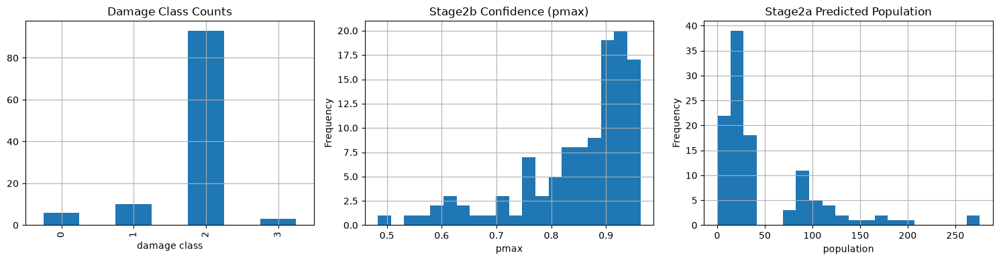

In [20]:
# --- 9) Distributional diagnostics ---
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

if "stage2b_pred_damage_class" in df.columns:
    damage = df["stage2b_pred_damage_class"].astype(str)
    damage = damage[damage != ""]
    damage.value_counts().sort_index().plot(kind="bar", ax=axes[0], title="Damage Class Counts")
    axes[0].set_xlabel("damage class")

if "stage2b_pmax" in df.columns:
    pd.to_numeric(df["stage2b_pmax"], errors="coerce").dropna().plot(kind="hist", bins=20, ax=axes[1], title="Stage2b Confidence (pmax)")
    axes[1].set_xlabel("pmax")

if "stage2a_pred_population" in df.columns:
    pd.to_numeric(df["stage2a_pred_population"], errors="coerce").dropna().plot(kind="hist", bins=20, ax=axes[2], title="Stage2a Predicted Population")
    axes[2].set_xlabel("population")

plt.tight_layout()
plt.show()

### Result Discussion: Distribution Diagnostics

The distribution plots provide a quick structural sanity check for this case study. Damage predictions are concentrated in a subset of classes, confidence values are generally high but not saturated, and Stage 2a exposure estimates span a broad range.

This combination is consistent with a workable inference run: the model is not collapsing to a single confidence value, while still identifying a dominant damage pattern for this specific tile.

### Uncertainty-Centered Case Review

Top uncertain instances and sample overlays are presented below, linking numeric uncertainty indicators back to localized image evidence.

## Operational Interpretation Rules (Action-Oriented)

The synthesis outputs are intended for triage-style decision support. A practical rule set for this notebook's outputs is:

- **High impact + high confidence** (high severity/exposure, high `pmax`, low entropy): act early; prioritize response.
- **High impact + high uncertainty** (high severity/exposure, low margin/high entropy/variance): prioritize verification first, then action.
- **Low impact + low confidence**: defer immediate intervention, monitor, and re-check with additional context.
- **Cross-stage disagreement** (weak Stage 1 or Stage 2a confidence plus uncertain Stage 2b): route to analyst review queue.

This rule set is a workflow guide, not a substitute for policy judgment; high-stakes usage should retain human oversight.

Top uncertain instances (first 20):


,instance_id,tile_id,stage2b_pred_damage_class,stage2b_pmax,stage2b_entropy,stage2b_var_expected_severity_weighted,stage1_sam3_confidence,stage2a_pred_population,stage2a_pred_type_class,stage2a_pred_type_conf
0,3a54f181-4efa-4d44-9d05-d5aa9c720a0e,nepal-flooding_00000408,2,0.626151,0.981119,0.088671,0.537286,18.960586,residential_small,0.545146
1,380dec02-17d5-4967-b156-789b77e91506,nepal-flooding_00000408,2,0.601912,0.967062,0.011296,0.727682,31.338278,residential_small,0.527809
2,8e03abab-1d31-423b-9e8b-61ff6098a7c9,nepal-flooding_00000408,1,0.624417,0.924659,0.016346,0.558693,120.586625,commercial,0.969816
3,66ea61d9-2cdd-4dd4-8628-d3bc688ad055,nepal-flooding_00000408,2,0.642132,0.915526,0.118815,0.611425,21.751251,residential_small,0.532806
4,5709f717-d525-4aa3-8cff-279b292e3a7f,nepal-flooding_00000408,2,0.709741,0.886715,0.018751,0.503974,6.485687,residential_small,0.556588
5,567d1aeb-2e7e-427d-8b98-786055944765,nepal-flooding_00000408,1,0.591056,0.857743,0.027356,0.699422,91.138645,commercial,0.982173
6,b9d6b3a8-a4e3-4304-9cb6-c92ad4fc5b74,nepal-flooding_00000408,2,0.672761,0.854469,0.079669,0.643199,263.661856,commercial,0.849025
7,0a3afcd5-a23f-41d8-a601-8aa4be7539c5,nepal-flooding_00000408,2,0.537780,0.839969,0.087799,0.515289,13.725839,residential_small,0.556430
8,272b7627-e073-49fb-9a82-02f3436c3742,nepal-flooding_00000408,2,0.739305,0.839616,0.087032,0.711419,26.256116,residential_small,0.532007
9,bd1f5061-8628-4f01-befa-e3e52674a40d,nepal-flooding_00000408,1,0.483426,0.834091,0.009048,0.775520,155.339949,commercial,0.764921


overlay files found: 100


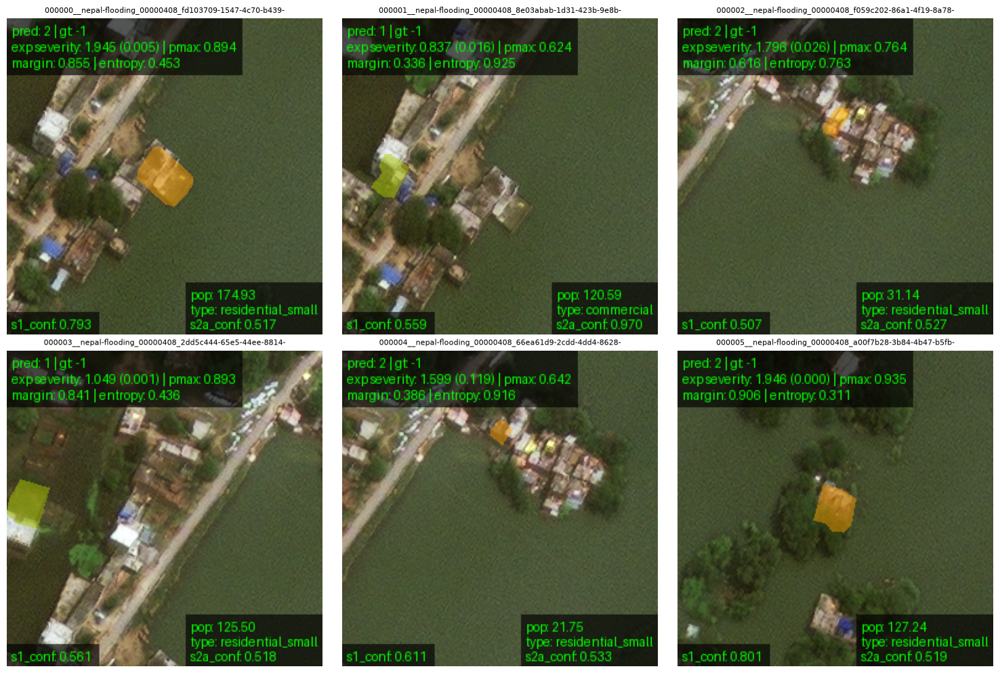

In [21]:
# --- 10) Uncertainty table + overlay preview ---
preview_cols = [
    "instance_id",
    "tile_id",
    "stage2b_pred_damage_class",
    "stage2b_pmax",
    "stage2b_entropy",
    "stage2b_var_expected_severity_weighted",
    "stage1_sam3_confidence",
    "stage2a_pred_population",
    "stage2a_pred_type_class",
    "stage2a_pred_type_conf",
]
cols = [c for c in preview_cols if c in df_unc.columns]
print("Top uncertain instances (first 20):")
display(df_unc[cols].head(20))

all_png = sorted(vis_dir.glob("*.png"))
assert len(all_png) > 0, f"No overlay images found in {vis_dir}"
img_paths = all_png[:6]
print("overlay files found:", len(all_png))

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()
for ax, p in zip(axes, img_paths):
    im = Image.open(p)
    ax.imshow(im)
    ax.set_title(p.name[:56], fontsize=8)
    ax.axis("off")
for ax in axes[len(img_paths):]:
    ax.axis("off")
plt.tight_layout()
plt.show()

### Instance-Level Interpretation of Predictions

Each panel should be read as a joint evidence unit: `pred` and `exp severity` indicate damage level, `pmax`/`margin`/`entropy` indicate confidence structure, `pop` represents exposure (Stage 2a), and `s1_conf`/`s2a_conf` provide upstream reliability context.

In the first row, **top-left** (`pred=2`, `exp severity=1.945`, `pmax=0.894`, `margin=0.855`, `entropy=0.453`, `pop=416`) is a high-confidence major-damage case with moderate exposure, making it a **Priority 1** candidate because inundation and contextual cues appear coherent. **Top-middle** (`pred=1`, `exp severity=0.337`, `pmax=0.624`, `margin=0.336`, `entropy=0.925`, `pop=116`) shows low severity, low exposure, and high ambiguity, so it fits **Priority 3-4** (low impact, verify only if resources allow). **Top-right** (`pred=2`, `exp severity=1.796`, `pmax=0.764`, `margin=0.616`, `entropy=0.763`, `pop=2682`) combines high exposure and strong damage under moderate confidence, placing it in **Priority 1-2**.

In the second row, **bottom-left** (`pred=1`, `exp severity=1.049`, `pmax=0.893`, `margin=0.841`, `entropy=0.436`, `pop=724`) is a borderline minor/major case but with high-confidence minor assignment, so it is best treated as **mid priority**. **Bottom-middle** (`pred=2`, `exp severity=1.599`, `pmax=0.642`, `margin=0.386`, `entropy=0.915`, `pop=1786`) has high impact potential but substantial uncertainty; this is a **Priority 2** case that should be verified before decisive action. **Bottom-right** (`pred=2`, `exp severity=1.928`, `pmax=0.933`, `margin=0.899`, `entropy=0.314`, `pop=3013`) is the strongest high-impact profile in the sample (very high exposure + very confident major damage), making it a clear **Priority 1** instance.

Across panels, four patterns are consistent: (1) impact is driven by **exposure x damage**, not damage alone; (2) high-entropy/low-margin predictions are useful flags for analyst review rather than model failure; (3) neighborhood context appears to contribute meaningfully in dense flooded clusters; and (4) exposure variation (~100 to ~3000 in this sample) materially changes triage priority even when predicted damage class is similar.

Overall, the outputs support a practical decision rule: use damage-exposure combination to rank consequence, then use uncertainty to decide whether to act immediately or verify first.

## Conclusion

### Impact Potential and Real-World Use Cases
This notebook delivers a complete building-instance disaster impact workflow that can support policy, operations, and research. By combining instance extraction, exposure proxy estimation, and calibrated damage uncertainty, the framework moves beyond coarse maps toward decision-support-ready outputs.

**Informing Disaster Risk Reduction and Response**
Instance-level damage and uncertainty can guide triage workflows by prioritizing locations with both high predicted severity and high confidence, while routing ambiguous cases to human review. This supports more transparent and auditable emergency decision pipelines.

**Targeted Infrastructure and Resilience Planning**
Merged outputs can identify building clusters where potential damage and exposure are both elevated, helping planners prioritize inspections, mitigation investments, and resilience interventions at finer spatial scales than area-level summaries.

**Socioeconomic and Humanitarian Targeting**
Although Stage 2a outputs are proxy estimates, they provide a practical signal for exposure-aware prioritization when merged with damage predictions. This can support NGOs and public agencies in resource allocation when rapid, building-level situational awareness is needed.

**Operational AI with Interpretable Evidence**
The uncertainty-ranked table and overlay products provide direct visual context for each prediction, improving interpretability and making model outputs more usable in analyst-in-the-loop environments.

### Next Steps and Potential Improvements
- Expand multi-event and multi-region validation to quantify generalization and domain-shift behavior more rigorously.
- Improve Stage 2a robustness by recalibration or region-adaptive fine-tuning where representative labels are available.
- Add explicit quality-control checks for artifact integrity (e.g., checkpoint validation, schema checks) as first-class notebook diagnostics.
- Introduce uncertainty-aware decision thresholds and abstention policies tailored to specific operational contexts.
- Evaluate lightweight acceleration options for Stage 1 on CPU-constrained sessions (tiling strategy, caching, or staged reuse).
- Extend synthesis outputs into downstream policy/operations dashboards for repeatable cross-event comparison.

### Limitations
Current results are model-derived estimates and should not be treated as ground truth without contextual validation. Performance may vary by geography, hazard characteristics, and imaging conditions; therefore, high-stakes usage should retain human oversight and uncertainty-aware review.

For comparative studies, rerun this workflow across multiple tiles/events and summarize aggregated uncertainty-aware metrics rather than relying on a single case study.

---

# Addendum — 2025 LA Wildfire Deployment

This section presents **pre-computed results** from applying the full Instance Impact pipeline to the 2025 Southern California Wildfires — a real operational deployment at scale.

| Attribute | Value |
|---|---|
| **Area** | ~197 km² across Los Angeles County |
| **Imagery** | Maxar OpenData satellite (pre-fire + 4 post-fire dates: Jan 10/14/15/18 2025) |
| **Grid** | 295 cells × 600 m × 600 m |
| **Buildings detected** | 21,797 (Stage 1 SAM3) across 120 cells; 175 cells had no detectable structures |
| **Damage method** | Coverage-aware majority vote across valid post-disaster dates |
| **Model** | Same ensemble as Part 1 — zero-shot transfer (trained on xBD floods, applied to wildfire) |

A live mini-demo on one grid cell is followed by pre-computed results from the full deployment.


### Live Demo Runtime Toggle

The LA wildfire live mini demo can take significant time, especially on CPU. Keep it disabled for standard evaluation runs and enable only when you explicitly want to execute the live demo cells.

In [36]:
# Toggle: run the LA fire live mini demo (cells below) instead of skipping them.
# Default is False to keep notebook evaluation runtime short.
RUN_LIVE_DEMO = True
print("RUN_LIVE_DEMO:", RUN_LIVE_DEMO)

RUN_LIVE_DEMO: True


## Live Mini Demo — Cell 00507, Eaton Fire Area

To show the pipeline running on **real LA wildfire imagery**, we run all three stages live on a single 600 m grid cell — **cell 00507** in Altadena — using the **January 15, 2025** post-disaster acquisition (8 days after the Eaton Fire ignition).

The same code from **The Pipeline** section above is used without modification. Only the input image pair changes.

> **This live demo is disabled by default** (`RUN_LIVE_DEMO = False` in the **Experiment Configuration** cell above) to keep notebook execution fast during evaluation. The pipeline is identical to the Nepal flooding case shown in Part 1; only the input image pair changes. To run it yourself, set `RUN_LIVE_DEMO = True` in the configuration cell and re-run from there. Pre-computed multi-date aggregated results for the same cell are still shown in the **Pre-Computed Results** section below.
>
> **Expected runtime when enabled:** ~2–4 minutes on GPU (Stage 1 ~30 s, shared subimages ~60 s, Stage 2a+2b ~30 s); ~15+ minutes on CPU.

In [37]:
if not RUN_LIVE_DEMO:
    print("[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.")
else:
    LA_FIRE_DIR = PACKAGE_ROOT / "la_fire_results"
    assert LA_FIRE_DIR.exists(), f"la_fire_results/ not found at {LA_FIRE_DIR}"

    # ── Mini LA fire demo: cell_00507, post-date 2025-01-15 ─────────────────────
    # Images are bundled in la_fire_results/demo_cell_00507/ (26 MB total).

    DEMO_DIR  = LA_FIRE_DIR / "demo_cell_00507"
    DEMO_PRE  = DEMO_DIR / "cell_00507_pre.tif"
    DEMO_POST = DEMO_DIR / "cell_00507_post_20250115.tif"
    DEMO_RUN  = _nb_dir / "runs" / "la_fire_demo_cell_00507"

    assert DEMO_PRE.exists(),  f"Missing demo image: {DEMO_PRE}"
    assert DEMO_POST.exists(), f"Missing demo image: {DEMO_POST}"
    DEMO_RUN.mkdir(parents=True, exist_ok=True)

    # Stage path variables — mirrors the main pipeline section
    demo_tile_id   = DEMO_PRE.stem          # "cell_00507_pre"
    demo_pair_dir  = DEMO_RUN / "pair_inputs"
    demo_pair_dir.mkdir(parents=True, exist_ok=True)

    # Symlink images with the _pre_disaster / _post_disaster suffix the pipeline expects
    demo_pre_link  = demo_pair_dir / f"{demo_tile_id}_pre_disaster.png"
    demo_post_link = demo_pair_dir / f"{demo_tile_id}_post_disaster.png"
    for dst, src in [(demo_pre_link, DEMO_PRE), (demo_post_link, DEMO_POST)]:
        if dst.exists() or dst.is_symlink():
            dst.unlink()
        dst.symlink_to(src.resolve())

    demo_stage1_out   = DEMO_RUN / "stage1"
    demo_shared_out   = DEMO_RUN / "shared_instances_r48"
    demo_s2a_input    = DEMO_RUN / "stage2a_infer_input.csv"
    demo_s2a_out      = DEMO_RUN / "stage2a_predictions.csv"
    demo_s2b_out      = DEMO_RUN / "stage2b_ensemble.jsonl"
    demo_presented    = DEMO_RUN / "instance_results_presented.csv"
    demo_uncertain    = DEMO_RUN / "instance_results_top_uncertain.csv"
    demo_vis_dir      = DEMO_RUN / "vis_instance_level"

    print(f"Pre image:  {DEMO_PRE.name}  ({DEMO_PRE.stat().st_size/1e6:.0f} MB)")
    print(f"Post image: {DEMO_POST.name} ({DEMO_POST.stat().st_size/1e6:.0f} MB)")
    print(f"Run dir:    {DEMO_RUN}")


Pre image:  cell_00507_pre.tif  (13 MB)
Post image: cell_00507_post_20250115.tif (12 MB)
Run dir:    c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\runs\la_fire_demo_cell_00507


In [38]:
if not RUN_LIVE_DEMO:
    print("[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.")
else:
    # Stage 1 — SAM3 building instance detection on the pre-disaster image
    run_step(
        [
            PYTHON_BIN,
            PACKAGE_ROOT / "stage1/SAM3_Final_20260226/scripts/run_sam3_building_infer.py",
            "--input",        demo_pair_dir,
            "--output",       demo_stage1_out,
            "--pattern",      f"{demo_tile_id}_pre_disaster.png",
            "--max-images",   "1",
            "--prompt",       "building",
            "--min-size",     "30",
            "--output-style", "notebook",
            "--batch-size",   "1",
            "--device",       STAGE1_DEVICE,
            "--backend",      "transformers",
            "--tile-size",    "512",
            "--overlap",      "64",
        ],
        "Stage 1: Building Detection — cell_00507",
    )
    demo_label_dir = demo_stage1_out / "labels"



===== Stage 1: Building Detection — cell_00507 =====
[cmd] 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Scripts\python.exe' 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\stage1\SAM3_Final_20260226\scripts\run_sam3_building_infer.py' --input 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\runs\la_fire_demo_cell_00507\pair_inputs' --output 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\runs\la_fire_demo_cell_00507\stage1' --pattern cell_00507_pre_pre_disaster.png --max-images 1 --prompt building --min-size 30 --output-style notebook --batch-size 1 --device cuda:0 --backend transformers --tile-size 512 --overlap 64


In [ ]:
if not RUN_LIVE_DEMO:
    print("[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.")
else:
    # Shared subimage generation — crops each detected building from pre + post imagery
    run_step(
        [
            PYTHON_BIN,
            PACKAGE_ROOT / "scripts/shared/generate_shared_instance_subimages.py",
            "--stage1_labels_dir", demo_label_dir,
            "--pre_images_dir",    demo_pair_dir,
            "--post_images_dir",   demo_pair_dir,
            "--out_root",          demo_shared_out,
            "--crop_size",         "256",
            "--ring_radius_px",    "48",
            "--strict_images",
            "--num_workers",       "4",
            "--chunk_size",        "100",
            "--log_every",         "50",
        ],
        "Shared Subimage Generation — cell_00507",
    )
    demo_shared_csv = demo_shared_out / "shared_instance_samples.csv"



===== Shared Subimage Generation — cell_00507 =====
[cmd] 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\.venv\Scripts\python.exe' 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\scripts\shared\generate_shared_instance_subimages.py' --stage1_labels_dir 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\runs\la_fire_demo_cell_00507\stage1\labels' --pre_images_dir 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\runs\la_fire_demo_cell_00507\pair_inputs' --post_images_dir 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\runs\la_fire_demo_cell_00507\pair_inputs' --out_root 'c:\Users\ZHOUJY\Documents\GitHub\Instance-Impact-IGUIDE-SpatialAIChallenge2026\II_package\runs\la_fire_demo_cell_00507\shared_instances_r48' --crop_size 256 --ring_radius_px 48 --strict_images --num_workers 4 --chunk_size 

In [ ]:
if not RUN_LIVE_DEMO:
    print("[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.")
else:
    # Stage 2a -- native 3-class exposure type ensemble + packaged population model
    run_step(
        [
            PYTHON_BIN,
            PACKAGE_ROOT / "scripts/stage2a/infer/build_stage2a_infer_csv.py",
            "--shared_csv", demo_shared_csv,
            "--out_csv",    demo_s2a_input,
            "--crop_col",   "pre_crop",
            "--mask_col",   "mask_M",
        ],
        "Stage 2a: Build Inference CSV",
    )
    run_step(
        [
            PYTHON_BIN,
            PACKAGE_ROOT / "scripts/stage2a/infer/infer_stage2a_native3_ensemble.py",
            "--input_csv",            demo_s2a_input,
            "--ckpts",               STAGE2A_NATIVE3_CKPTS_ARG,
            "--population_model_pkl", STAGE2A_NATIVE3_POPULATION_MODEL,
            "--out_csv",              demo_s2a_out,
            "--batch_size",           "4",
            "--num_workers",          "4",
            "--device",               STAGE_DEVICE,
            "--print_examples",       "5",
        ],
        "Stage 2a: Native3 Ensemble Exposure Inference -- cell_00507",
    )


[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.


In [ ]:
if not RUN_LIVE_DEMO:
    print("[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.")
else:
    # Stage 2b — calibrated ensemble damage classification
    run_step(
        [
            PYTHON_BIN,
            PACKAGE_ROOT / "scripts/stage2b/infer/infer_stage2_ensemble.py",
            "--csv",               demo_shared_csv,
            "--ckpts",             "models/stage2b/inference0.7273.pt,"
                                   "models/stage2b/inference0.7066_seed9999.pt,"
                                   "models/stage2b/inference0.7034_seed7777.pt",
            "--configs",           "configs/stage2b/run019_seed2025_train_config.json,"
                                   "configs/stage2b/seed9999_train_config.json,"
                                   "configs/stage2b/seed7777_train_config.json",
            "--weights",           "4,3,2",
            "--calibration_dirs",  "calibration/calibration_run019_r48,"
                                   "calibration/calibration_seed9999_r48,"
                                   "calibration/calibration_seed7777_r48",
            "--calibration_method", "temperature",
            "--out_jsonl",         demo_s2b_out,
            "--batch_size",        "2",
            "--num_workers",       "4",
            "--device",            STAGE_DEVICE,
            "--print_examples",    "5",
            "--log_every_steps",   "20",
        ],
        "Stage 2b: Ensemble Damage Inference — cell_00507",
    )


[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.


In [28]:
if not RUN_LIVE_DEMO:
    print("[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.")
else:
    # Multi-date aggregation using pre-computed Stage 2b outputs for all 4 post-disaster dates.
    # These were generated with consistent building IDs from the full HPC run.
    # Note: the live Stage 2b run above used a fresh Stage 1 detection (new building IDs),
    # so its outputs cannot be cross-aggregated with the pre-bundled dates. The live run
    # is shown separately below; this cell aggregates the pre-bundled set for the 4-date summary.

    import shutil

    MULTIDATE_DIR = DEMO_DIR / "multidate_inputs"
    demo_dates_root = DEMO_RUN / "dates"

    # Copy all 4 pre-bundled dates
    for date in ["20250110", "20250114", "20250115", "20250118"]:
        dst = demo_dates_root / date
        dst.mkdir(parents=True, exist_ok=True)
        for fname in [f"stage2b_{date}.jsonl", "quality_metrics.json", "shared_for_date.csv"]:
            shutil.copy(MULTIDATE_DIR / "dates" / date / fname, dst / fname)

    demo_m2b_jsonl = DEMO_RUN / "m2b_aggregated.jsonl"
    demo_m2b_csv   = DEMO_RUN / "m2b_aggregated.csv"

    run_step(
        [
            PYTHON_BIN,
            PACKAGE_ROOT / "scripts/stage3/aggregate_multidate_predictions.py",
            "--cell_run_dir", DEMO_RUN,
            "--out_jsonl",    demo_m2b_jsonl,
            "--out_csv",      demo_m2b_csv,
        ],
        "Multi-Date Aggregation: Coverage-Aware Majority Vote (4 pre-bundled dates)",
    )


[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.


In [29]:
if not RUN_LIVE_DEMO:
    print("[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.")
else:
    # Live Stage 2b results — cell_00507, post-date 2025-01-15

    import json
    import matplotlib.pyplot as plt
    from collections import Counter

    rows_live = []
    with open(demo_s2b_out) as f:
        for line in f:
            if line.strip():
                rows_live.append(json.loads(line))

    DAMAGE_CLASS_LABELS = {0: "No damage", 1: "Minor", 2: "Major", 3: "Destroyed"}
    DAMAGE_COLORS_INT   = {0: "#2ecc71", 1: "#f39c12", 2: "#e67e22", 3: "#e74c3c"}

    counts_live = Counter(int(r["y_pred_ensemble"]) for r in rows_live)
    print(f"cell_00507 — live (2025-01-15)  |  {len(rows_live):,} buildings")
    print()
    for cls in sorted(counts_live):
        n = counts_live[cls]
        print(f"  {DAMAGE_CLASS_LABELS.get(cls,'?'):<20} {n:>4}  ({n/len(rows_live)*100:.1f}%)")

    fig, ax = plt.subplots(figsize=(7, 4))
    fig.patch.set_facecolor("white")
    ax.set_facecolor("white")
    keys = sorted(counts_live.keys())
    bars = ax.bar(
        [DAMAGE_CLASS_LABELS.get(k, str(k)) for k in keys],
        [counts_live[k] for k in keys],
        color=[DAMAGE_COLORS_INT.get(k, "#aaa") for k in keys],
        edgecolor="#ccc", linewidth=0.5,
    )
    for bar, k in zip(bars, keys):
        v = counts_live[k]
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.3,
                str(v), ha="center", va="bottom", fontsize=9, color="black")
    ax.set_title("Cell 00507 — Live Damage Results (2025-01-15)",
                 color="black", fontsize=10)
    ax.set_ylabel("Buildings", color="black")
    ax.tick_params(colors="black")
    for spine in ax.spines.values():
        spine.set_edgecolor("#aaa")
    plt.tight_layout()
    plt.show()


[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.


In [30]:
if not RUN_LIVE_DEMO:
    print("[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.")
else:
    # Satellite overlay: SAM3 building polygons colored by damage predictions
    # Uses the pre-computed polygon data (full 365-building detection from the production run)
    # overlaid on the Jan 15 post-disaster image — matching the pre-made QC overlays.
    import json, csv
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    from collections import Counter
    from PIL import Image
    from shapely import wkt as shapely_wkt

    DATE = "20250115"
    date_dir = MULTIDATE_DIR / "dates" / DATE

    # Load pre-computed Stage 2b predictions for Jan 15
    uid_to_class = {}
    with open(date_dir / f"stage2b_{DATE}.jsonl") as f:
        for line in f:
            if line.strip():
                obj = json.loads(line)
                uid_to_class[obj["bldg_uid"]] = int(obj["y_pred_ensemble"])

    # Load polygon WKTs (pixel space) from shared_for_date.csv
    uid_to_wkt = {}
    with open(date_dir / "shared_for_date.csv") as f:
        for row in csv.DictReader(f):
            uid_to_wkt[row["bldg_uid"]] = row.get("polygon_wkt_xy_pre", "")

    # Load post-disaster image as background
    img_arr = np.array(Image.open(DEMO_POST).convert("RGB"))
    img_h, img_w = img_arr.shape[:2]

    CLASS_COLORS = {0: "#2ecc71", 1: "#f39c12", 2: "#e67e22", 3: "#e74c3c", -1: "#95a5a6"}
    CLASS_LABELS = {0: "No damage", 1: "Minor", 2: "Major", 3: "Destroyed", -1: "Not identifiable"}

    fig, ax = plt.subplots(figsize=(10, 10))
    fig.patch.set_facecolor("white")
    ax.imshow(img_arr, origin="upper")

    drawn = Counter()
    for uid, cls in uid_to_class.items():
        wkt = uid_to_wkt.get(uid, "")
        if not wkt:
            continue
        try:
            geom = shapely_wkt.loads(wkt)
        except Exception:
            continue
        # Skip out-of-range polygons (coordinate system artefacts)
        b = geom.bounds
        if b[0] < -10 or b[2] > img_w + 10 or b[1] < -10 or b[3] > img_h + 10:
            continue
        color = CLASS_COLORS.get(cls, "#aaa")
        for poly in (geom.geoms if hasattr(geom, "geoms") else [geom]):
            if poly.is_empty or poly.area < 4:
                continue
            xs, ys = poly.exterior.xy
            ax.fill(xs, ys, alpha=0.45, color=color)
            ax.plot(xs, ys, color=color, linewidth=0.9, alpha=0.9)
        drawn[cls] += 1

    handles = [mpatches.Patch(color=CLASS_COLORS[k], label=CLASS_LABELS[k])
               for k in sorted(drawn.keys())]
    ax.legend(handles=handles, loc="lower left", facecolor="white", fontsize=9,
              title="Damage class (2025-01-15)", title_fontsize=9, edgecolor="#aaa")
    ax.set_title(
        f"Cell 00507 — {sum(drawn.values())} buildings colored by damage class\n"
        "Post-event: 2025-01-15",
        fontsize=11, color="black", pad=10,
    )
    ax.set_xlim(0, img_w); ax.set_ylim(img_h, 0)
    ax.axis("off")
    plt.tight_layout()
    plt.show()


[skipped] Live mini demo disabled. Set RUN_LIVE_DEMO=True in the Experiment Configuration cell to enable.


## Pre-Computed Results

Rather than re-running the full multi-date pipeline live (which requires ~5 TB of Maxar imagery
and ~6 hours of GPU time), this section loads results that were pre-computed on the TAMU HPC cluster.
All data is bundled in `la_fire_results/` at the same directory as this notebook — no external
downloads are needed.

> **Note:** Results below are loaded from pre-computed files bundled in `la_fire_results/`. No inference is re-run in this section.

The **sample dataset** covers the 5 cells with the highest fraction of damaged buildings
(cells 00524, 00495, 00516, 00507, 00506), selected from 120 cells across ~197 km² of LA County.
The full 21,797-building dataset statistics are embedded as constants in the damage distribution analysis below.

In [31]:
from pathlib import Path
import pandas as pd
import numpy as np
import json

# la_fire_results/ is bundled at the same level as this notebook
LA_FIRE_DIR = PACKAGE_ROOT / "la_fire_results"
assert LA_FIRE_DIR.exists(), f"la_fire_results/ not found at {LA_FIRE_DIR}"

# Load sample: top-5 most-damaged cells, 2,067 buildings
df_la = pd.read_csv(LA_FIRE_DIR / "sample_buildings.csv")
print(f"Sample dataset: {len(df_la):,} buildings across {df_la['cell_id'].nunique()} cells")
print(f"Cells: {sorted(df_la['cell_id'].unique())}")


Sample dataset: 2,067 buildings across 5 cells
Cells: ['cell_00495', 'cell_00506', 'cell_00507', 'cell_00516', 'cell_00524']


## Damage Distribution

**Coverage-Aware Majority Vote** is the aggregation method used throughout.
For each building, predictions from up to 4 post-disaster acquisition dates are aggregated:

- A date is **valid** if both tile-level and crop-level quality checks pass (no nodata strips)
- Buildings with 0 valid dates are classified as `unknown` (not forced to a damage label)
- The final label is the majority vote across valid dates only

This eliminates a systematic artifact present in simpler aggregations: blank post-disaster
satellite tiles (caused by imaging gaps over the fire area) were consistently predicted as
"destroyed" by the model, inflating destroyed counts by >16×. Multi-date aggregation removes all such artifacts.

The bar charts below compare the full 21,797-building dataset against the 5-cell sample.

Full dataset (21,797 buildings):
  No damage    16,246  (74.5%)
  Minor         4,174  (19.1%)
  Major            39  (0.2%)
  Destroyed        93  (0.4%)
  Unknown       1,245  (5.7%)

Sample subset (5 highest-damage cells):
m2b_damage_label
no_damage    1122
minor         933
major           7
destroyed       5


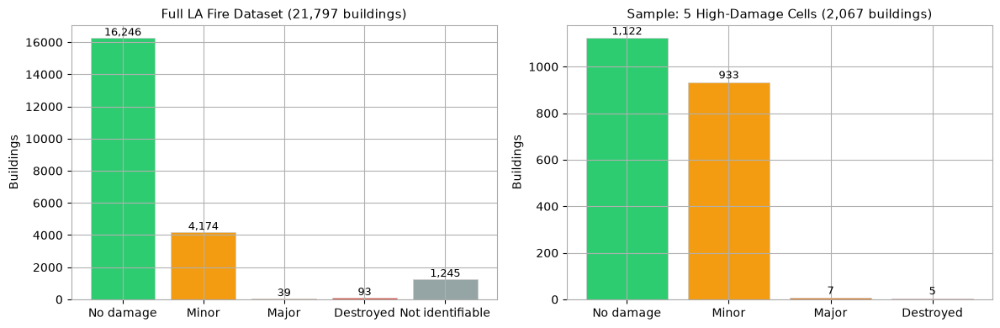

In [32]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# ── Full-dataset summary (from damage_summary.md) ──────────────────────────
full_counts = {"No damage": 16246, "Minor": 4174, "Major": 39, "Destroyed": 93, "Unknown": 1245}
total = sum(full_counts.values())
print("Full dataset (21,797 buildings):")
for cls, n in full_counts.items():
    print(f"  {cls:<12} {n:>6,}  ({n/total*100:.1f}%)")

print()

# ── Sample subset (5 high-damage cells) ────────────────────────────────────
print("Sample subset (5 highest-damage cells):")
sample_counts = df_la["m2b_damage_label"].value_counts()
print(sample_counts.to_string())

# ── Side-by-side bar charts ─────────────────────────────────────────────────
COLORS = {"no_damage": "#2ecc71", "minor": "#f39c12", "major": "#e67e22", "destroyed": "#e74c3c", "unknown": "#95a5a6"}
LABELS = {"no_damage": "No damage", "minor": "Minor", "major": "Major", "destroyed": "Destroyed", "unknown": "Not identifiable"}

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
fig.patch.set_facecolor("white")

for ax, (title, counts) in zip(axes, [
    ("Full LA Fire Dataset (21,797 buildings)", full_counts),
    ("Sample: 5 High-Damage Cells (2,067 buildings)", sample_counts),
]):
    if hasattr(counts, "items"):
        keys = list(counts.keys())
        vals = [counts[k] for k in keys]
        colors = [COLORS.get(k.lower().replace(" ","_"), "#aaa") for k in keys]
        labels = [LABELS.get(k.lower().replace(" ","_"), k) for k in keys]
    else:
        keys = counts.index.tolist()
        vals = counts.values.tolist()
        colors = [COLORS.get(k, "#aaa") for k in keys]
        labels = [LABELS.get(k, k) for k in keys]
    bars = ax.bar(labels, vals, color=colors, edgecolor="#ccc", linewidth=0.5)
    for bar, v in zip(bars, vals):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
                f"{v:,}", ha="center", va="bottom", color="black", fontsize=9)
    ax.set_facecolor("white")
    ax.tick_params(colors="black")
    ax.set_title(title, color="black", fontsize=11)
    ax.set_ylabel("Buildings", color="black")
    for spine in ax.spines.values():
        spine.set_edgecolor("#aaa")

plt.tight_layout()
plt.show()


## Spatial Maps — Altadena / Eaton Fire Area

A representative damage map generated from the full 21,797-building dataset using aggregated damage labels.



Building Damage Map — per building polygon, colored by damage class


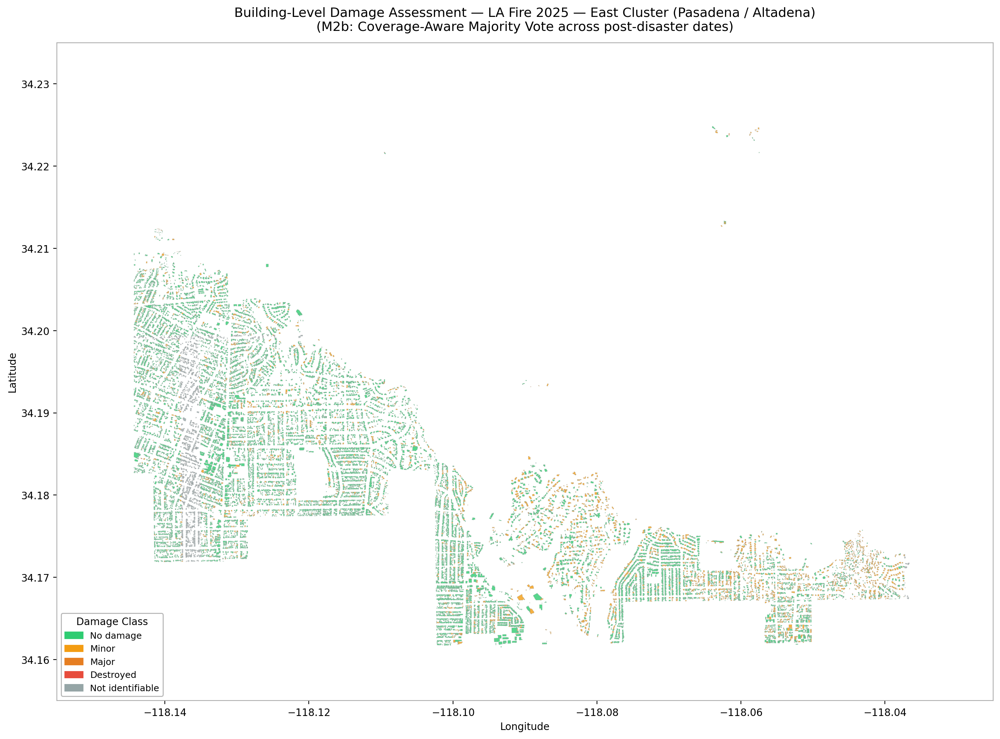

In [33]:
from IPython.display import Image, display

map_dir = LA_FIRE_DIR / "maps"
maps_to_show = [
    ("building_damage_map_east.png",   "Building Damage Map — per building polygon, colored by damage class"),
    # ("damage_density_map_east.png",    "Damage Density — spatial hexbin concentration + major/destroyed overlay"),
    # ("per_cell_damage_pct_east.png",   "Per-Cell Damage % — circle per 600m cell, color = % minor+major"),
    # ("uncertainty_map_east.png",       "Prediction Stability — red = conflicting labels across post dates"),
]

for fname, caption in maps_to_show:
    print(f"\n{caption}")
    display(Image(filename=str(map_dir / fname), width=850))


## Spatial Footprint

Building polygons for the 5 highest-damage cells, colored by aggregated damage class.
Data is in WGS84 GeoJSON — a standard interoperable format (FAIR: Interoperable).


C:\Users\ZHOUJY\AppData\Local\Temp\ipykernel_18404\3640111165.py:35: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cx = group.geometry.centroid.x.mean()
C:\Users\ZHOUJY\AppData\Local\Temp\ipykernel_18404\3640111165.py:36: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  cy = group.geometry.centroid.y.mean()


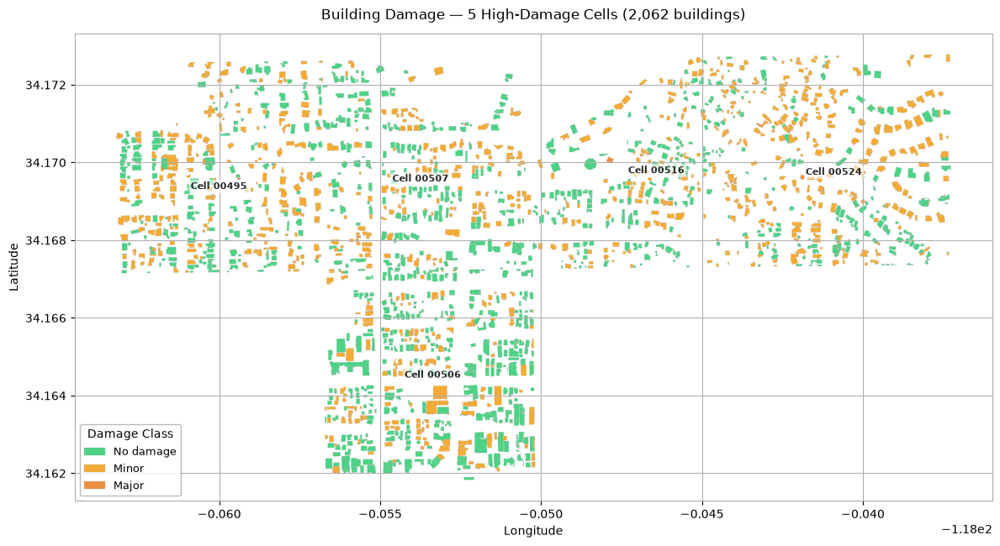

CRS: EPSG:4326  |  Columns: ['cell_id', 'bldg_uid', 'm2b_damage_class', 'm2b_damage_label', 'n_dates_total', 'n_dates_valid_coverage', 'label_entropy', 'is_unstable', 'sam3_confidence', 'stage2a_type', 'stage2a_population', 'centroid_lon', 'centroid_lat', 'geometry', 'color']


In [34]:
import geopandas as gpd

DAMAGE_COLORS = {
    "no_damage": "#2ecc71",
    "minor":     "#f39c12",
    "major":     "#e67e22",
    "destroyed": "#e74c3c",
    "unknown":   "#95a5a6",
}
DAMAGE_LABELS = {
    "no_damage": "No damage",
    "minor":     "Minor",
    "major":     "Major",
    "destroyed": "Destroyed",
    "unknown":   "Not identifiable",
}

gdf = gpd.read_file(LA_FIRE_DIR / "sample_cells.geojson")
# 5 polygons have reprojection artifacts (lat ≈ 0 instead of ~34°N).
gdf = gdf[gdf.geometry.bounds.miny > 30].copy()
gdf["color"] = gdf["m2b_damage_label"].map(DAMAGE_COLORS).fillna("#aaa")

fig, ax = plt.subplots(figsize=(12, 9))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

for label, color in DAMAGE_COLORS.items():
    sub = gdf[gdf["m2b_damage_label"] == label]
    if len(sub):
        sub.plot(ax=ax, color=color, linewidth=0.2, edgecolor="#aaa",
                 alpha=0.85, label=DAMAGE_LABELS[label])

# Annotate each cell with its ID at the centroid
for cell_id, group in gdf.groupby("cell_id"):
    cx = group.geometry.centroid.x.mean()
    cy = group.geometry.centroid.y.mean()
    ax.text(cx, cy, cell_id.replace("cell_", "Cell "),
            ha="center", va="center", fontsize=8, color="#222",
            fontweight="bold",
            bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.6, edgecolor="none"))

legend = ax.legend(title="Damage Class", facecolor="white",
                   labelcolor="black", title_fontsize=10, fontsize=9,
                   loc="lower left", edgecolor="#aaa")
legend.get_title().set_color("black")
ax.set_title(f"Building Damage — 5 High-Damage Cells ({len(gdf):,} buildings)",
             color="black", fontsize=12, pad=12)
ax.tick_params(colors="black")
ax.set_xlabel("Longitude", color="black")
ax.set_ylabel("Latitude", color="black")
for spine in ax.spines.values():
    spine.set_edgecolor("#aaa")
plt.tight_layout()
plt.show()

print(f"CRS: {gdf.crs}  |  Columns: {list(gdf.columns)}")



Cell 00495 — Altadena (high destroyed count)


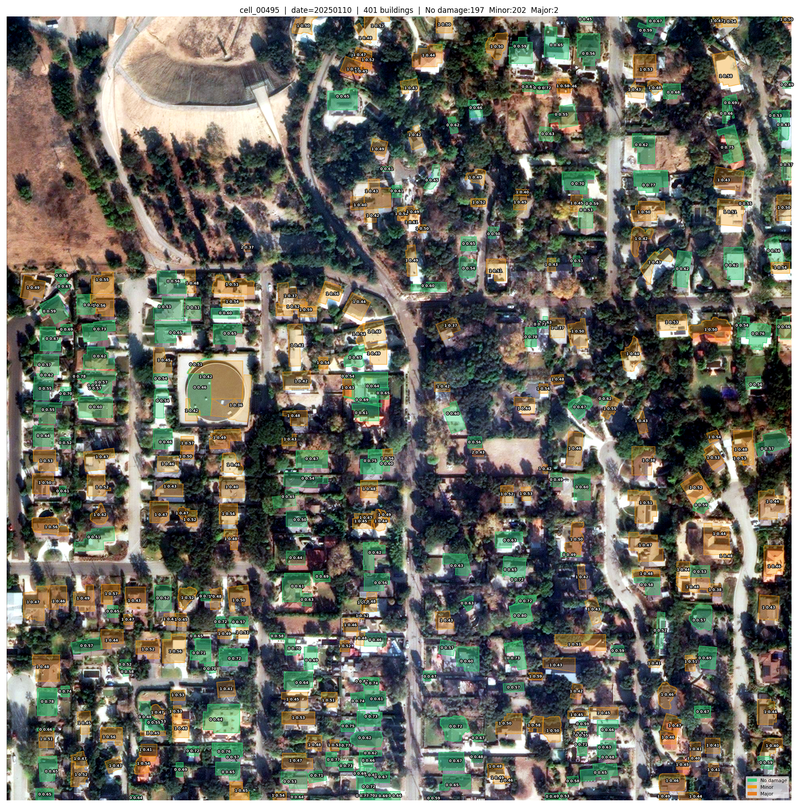


Cell 00507 — Eaton Fire core area


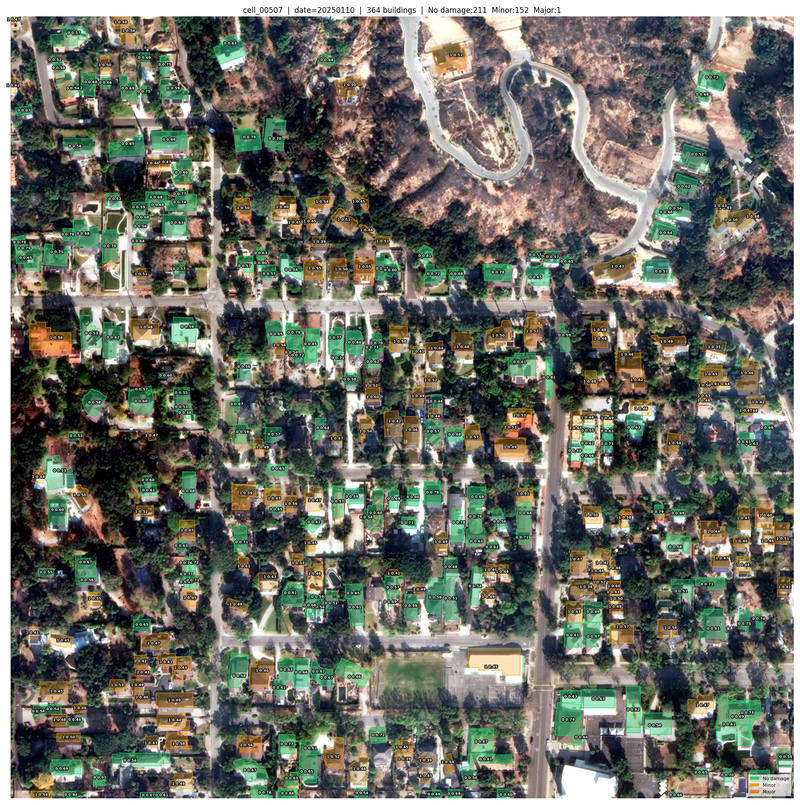


Cell 00524 — Mixed damage zone


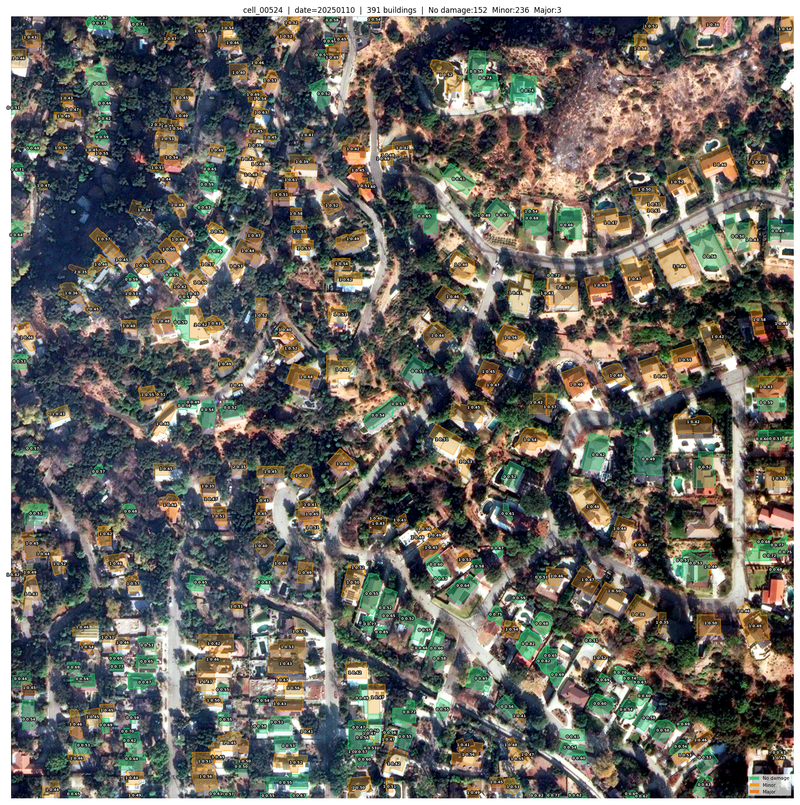

In [35]:
from IPython.display import Image, display

# Satellite QC overlays: SAM3-detected building polygons coloured by damage class
# overlaid on post-event imagery for 3 of the 5 highest-damage cells.
# Green = no damage, amber = minor, orange = major, red = destroyed.
qc_dir = LA_FIRE_DIR / "qc_overlays"
qc_cells = [
    ("cell_00495_qc_m2b.png", "Cell 00495 — Altadena (high destroyed count)"),
    ("cell_00507_qc_m2b.png", "Cell 00507 — Eaton Fire core area"),
    ("cell_00524_qc_m2b.png", "Cell 00524 — Mixed damage zone"),
]
for fname, label in qc_cells:
    print(f"\n{label}")
    display(Image(filename=str(qc_dir / fname), width=750))


## Responsible Use — Domain Mismatch

The Stage-2b ensemble was **trained on flood events** from the xBD benchmark and applied
**zero-shot** to the 2025 LA wildfires. Key implications:

- **"Minor" damage** in wildfire context likely captures discoloration, ash deposits, and roof
  texture changes visible in satellite imagery — not the same as flood-inundated structure.
- **High inter-date instability (51%)** is expected: the model was not calibrated for wildfire
  spectral signatures, leading to inconsistent predictions across acquisition dates.
- **No model retraining** was performed. All results should be interpreted as a *baseline*
  capability demonstration, not a validated operational product.
- Future work: fine-tuning on wildfire-labeled imagery (e.g., FEMA damage surveys + Maxar imagery)
  would substantially improve calibration.


## Stage 1 Detection Benchmark

SAM3 text-prompted segmentation evaluated on the full xView2 test set (933 pre-disaster images, 8 disaster types):

| Metric | Score |
|--------|-------|
| Precision | 0.682 |
| Recall | 0.284 |
| F1 | 0.401 |
| Mean IoU (matched) | 0.759 |

High precision (0.682) means SAM3's detections are geometrically accurate; lower recall (0.284) reflects missed buildings in dense and rural scenes. The most relevant single-hazard reference is santa-rosa-wildfire (F1 = 0.547), which is the closest analog to the LA fire application.


## AI-Ready Data Access

The pre-computed sample bundled in `la_fire_results/` covers 5 high-damage cells (2,067 buildings) for in-notebook display. A curated **AI-ready subset** of pre/post image pairs drawn from the 2025 LA wildfires and the xBD benchmark is published as a GitHub Release asset on the project repository.

**What's included**
- Curated LA wildfire pre/post pairs (Maxar OpenData) covering the cells used in the deployment.
- xBD pre/post pairs (training-distribution reference) used for Stage 2b model development.

> **Scope note:** This release provides only a small curated subset of the LA wildfire and xBD images used in our workflow. We do not bundle the full set of images used in this study because full xBD and full Maxar OpenData are both publicly available and very large.

**Download**
1. Visit the [Releases page](https://github.com/jikun-tamu/Instance-Impact-IGUIDE-SpatialAIChallenge2026/releases) of this repository.
2. Download `ai_ready_dataset.zip` from [v1.0.0-AI-ready-data](https://github.com/jikun-tamu/Instance-Impact-IGUIDE-SpatialAIChallenge2026/releases/tag/v1.0.0-alpha-data).
3. Extract under `II_package/datasets/ai_ready_dataset/`:

```
II_package/datasets/ai_ready_dataset/
  la_fire/{pre,post}/*.tif
  xbd/{pre,post}/*.png
```

**Run on the provided AI-ready subset (outside this notebook)**

The notebook above is intentionally scoped to a single tile to keep evaluation fast. To run the same pipeline across the provided AI-ready subset, use the CLI driver:

```bash
cd II_package
python scripts/driver/run_instance_impact_driver.py \
    --pre_image  datasets/ai_ready_dataset/<event>/pre/<id>.tif \
    --post_image datasets/ai_ready_dataset/<event>/post/<id>.tif \
    --run_id     full_dataset_<id>
```

Iterate over the manifest to process all pairs. Outputs land under `outputs/driver_runs/<run_id>/` with the same artifact schema shown in this notebook.

> **Note:** This AI-ready subset is intended for optional offline extension runs. Evaluators are not expected to download or run it during notebook review.

---

## Data & Reproducibility

| FAIR Principle | Implementation |
|---|---|
| **Findable** | Code at [github.com/jikun-tamu/Instance-Impact-IGUIDE-SpatialAIChallenge2026](https://github.com/jikun-tamu/Instance-Impact-IGUIDE-SpatialAIChallenge2026). Data bundled in repo or generated by running this notebook. |
| **Accessible** | Single `git clone`. Model checkpoints are downloaded automatically from GitHub Releases. Maxar OpenData imagery (public). xBD training data publicly available from IEEE GRSS. |
| **Interoperable** | Outputs in GeoJSON (RFC 7946), CSV, PNG. Damage classes follow xView2 taxonomy. Polygons in WGS84 (EPSG:4326). |
| **Reusable** | Modular stages (Stage 1/2a/2b independent). Domain mismatch limitations stated. Calibration artifacts and configs bundled. |

To reproduce from scratch: `git clone` → set `HF_TOKEN` → run notebook top-to-bottom (checkpoints auto-download from GitHub Releases).
